### Importing Modules

In [1]:
import pandas as pd
# data visualisation and manipulation
import numpy as np
import plotly.graph_objects as go
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import style
#configure
# sets matplotlib to inline and displays graphs below the corressponding cell.
%matplotlib inline  
style.use('fivethirtyeight')
import warnings
warnings.filterwarnings('ignore')
import os
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
%matplotlib inline

from datetime import date, time, datetime
import plotly.graph_objs as go
import plotly.offline as pyo
import plotly.figure_factory as ff
import plotly.express as px
from plotly import tools
from plotly.subplots import make_subplots
from plotly.offline import iplot

# **Forecasting Offensive Rebounds in Basketball Using Location Data**

## Dataset Overview

The datasets for this project include:

1. Play-by-Play Data (PBP): This dataset includes team names and, in the training set, specifies if a rebound is taken offensively or defensively.

2. Location Data (Locs): This is the essence of the competition. This dataset dilineates the coordinates of defenders, offensive players, and the shooter for each specific play.


## Objective

Given the data, the task is to predict the likelihood of an offensive rebound after a missed shot. The prediction will be based on the positions of the players at the time of the shot.

## My Approach

In my exploration of this problem, here is my thorough approach:

1. **Data preprocessing & EDA** :           Cleaned the data in dataframes. Explored visualizations of data.

2. **Distance Features**:              Calculated distances between key players and positions to observe disadvantages and advantages in obtaining an offensive board.

3. **Complex Feature Engineering**:   Developed features using the results of EDA and basketball intuition

4. **Tuning and Model Valuation**:        Tuning hyperparameters using crossvalidation. Evaluating multiple models.

5. **Model Exploration**:           Along with the traditional algorithms, I experimented with Neural Networks and model ensembles. 



## Table of Contents

1. **[EDA & Data Preprocessing](#EDA-&-Data-Preprocessing)**
   
2. **[Feature Engineering](#Feature-Engineering)**

3. **[Complex Feature Engineering](#Complex-Feature-Engineering)**

4. **[Model Experimentation](#Model-Experimentation)**

5. **[Graph Neural Networks (GNNs) for Spatial Analysis](#Graph-Neural-Networks-(GNNs)-for-Spatial-Analysis)**

6. **[Conclusion](#Conclusion)**

# **EDA & Data Preprocessing**

In this section, we strive to deeply understand our dataset and derive insights that will be critical for our modeling phase. Our data revolves around basketball play-by-play events, focusing particularly on shots that are missed and subsequently rebounded.

## EDA / Data Preprocessing Structure:

1. *Cleaning data*:
I'll start by looking at each dataset. I add a new column to distinguish the test data and train data for the respective datasets. I then combine the two datasets on the "id" column. 

2. *Visual Exploration*:
Next I'll dive into the simply visuals to gain a better understanding of the dataset. We'll make extensive use of visual tools like scatter plots to understand player positioning, histograms for distributions, and mapping. 

3. *Missing Data and Outliers*:
We'll identify any missing values and decide on imputation strategies. Similarly, outliers, if any, will be flagged, and we'll determine how to handle them.




### Locations 

In [2]:
train_locs = pd.read_csv("train_locs.csv")
test_locs = pd.read_csv("test_locs.csv")
train_locs["dataset"] = "train"
test_locs["dataset"] = "test" 
train_locs.head()

,id,court_x,court_y,annotation_code,dataset
0,2-2,72.807686,37.409669,d1,train
1,2-2,79.080643,31.477796,d2,train
2,2-2,69.956321,24.467300,d3,train
3,2-2,75.468933,13.861763,d4,train
4,2-2,84.973496,19.254422,d5,train


### Play-by-Play Positions

In [3]:
train_pbp = pd.read_csv("train_pbp.csv")
test_pbp = pd.read_csv("test_pbp.csv")
train_pbp["dataset"] = "train"
test_pbp["dataset"] = "test"
train_pbp.head()

,id,is_oreb,team,opponent,conference,opp_conference,dataset
0,2-2,0,Kentucky,Duke,SEC,ACC,train
1,2-3,0,Duke,Kentucky,ACC,SEC,train
2,2-4,0,Kentucky,Duke,SEC,ACC,train
3,2-6,1,Kentucky,Duke,SEC,ACC,train
4,2-8,0,Kentucky,Duke,SEC,ACC,train


In [4]:
df = pd.merge(pd.concat([train_pbp, test_pbp]), pd.concat([train_locs, test_locs]), on = ["dataset", "id"])
train_df = df.loc[(df.dataset == "train")]
test_df = df.loc[(df.dataset == "test")]
df.head()

,id,is_oreb,team,opponent,conference,opp_conference,dataset,court_x,court_y,annotation_code
0,2-2,0.0,Kentucky,Duke,SEC,ACC,train,72.807686,37.409669,d1
1,2-2,0.0,Kentucky,Duke,SEC,ACC,train,79.080643,31.477796,d2
2,2-2,0.0,Kentucky,Duke,SEC,ACC,train,69.956321,24.467300,d3
3,2-2,0.0,Kentucky,Duke,SEC,ACC,train,75.468933,13.861763,d4
4,2-2,0.0,Kentucky,Duke,SEC,ACC,train,84.973496,19.254422,d5


### EDA Dataset exploration

# Offensive Rebound Percentages in Home/Away Games

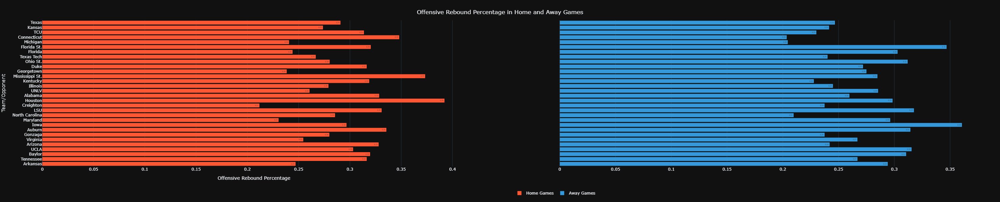

In [45]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
temp = train_df.drop_duplicates(subset = "id").reset_index(drop = True)
top_30_teams = temp['team'].value_counts().nlargest(30).index.tolist()
filtered_temp = temp[temp['team'].isin(top_30_teams) | temp['opponent'].isin(top_30_teams)]

team_home = filtered_temp[filtered_temp['team'].isin(top_30_teams)]
team_away = filtered_temp[filtered_temp['opponent'].isin(top_30_teams)]
# Calculate offensive rebound percentages for home and away games
team_home_scores = team_home.groupby('team')['is_oreb'].mean().reset_index()
team_away_scores = team_away.groupby('opponent')['is_oreb'].mean().reset_index()

# Create subplots with two horizontal bar charts
fig = make_subplots(rows=1, cols=2, shared_yaxes=True, horizontal_spacing=0.1)

trace1 = go.Bar(
    y=team_home_scores['team'],
    x=team_home_scores['is_oreb'],
    text=team_home_scores['is_oreb'].apply(lambda x: f"{x:.2f}"),
    textposition='inside',
    name='Home Games',
    marker=dict(color='#FF5733'),  # Different color for home games
    orientation='h',
)

trace2 = go.Bar(
    y=team_away_scores['opponent'],
    x=team_away_scores['is_oreb'],
    text=team_away_scores['is_oreb'].apply(lambda x: f"{x:.2f}"),
    textposition='inside',
    name='Away Games',
    marker=dict(color='#3498DB'),  # Different color for away games
    orientation='h',
)

fig.add_trace(trace1, row=1, col=1)
fig.add_trace(trace2, row=1, col=2)

# Update layout and styling
fig.update_layout(
    title={'text': "Offensive Rebound Percentage in Home and Away Games",
           'y': 0.95,
           'x': 0.5,
           'xanchor': 'center',
           'yanchor': 'top'},
    legend_orientation='h',
    legend=dict(x=0.5, y=-0.15),
    xaxis=dict(title='Offensive Rebound Percentage'),
    yaxis=dict(title='Team/Opponent', categoryorder='total ascending'),
    template='plotly_dark',
    height=600,
    margin=dict(l=50, r=50, t=60, b=60),
)

# Update bar modes and trace appearance
fig.update_traces(marker_line_width=0, textfont_size=12)

# Show the plot
fig.show()



**This chart aims to contrast team performances regarding their offensive rebounding skills in both home and away matches. The layered bars facilitate a straightforward comparison of percentages for each team in these scenarios.**

### Court Positions of Shooters

In [ ]:
import plotly.graph_objs as go
from plotly.offline import iplot
import pandas as pd

# Assuming you have the required data in the 'data' DataFrame.
# Replace 'data' with the actual name of your DataFrame.

temp = df.loc[(df.annotation_code == "s")].reset_index(drop = True)
# Create a scatter plot
trace = go.Scatter(
    x=temp['court_x'],
    y=temp['court_y'],
    text=temp['annotation_code'],  # Use 'annotation_code' for the text annotations
    textposition='bottom center',
    mode='markers+text',  # Show markers and text annotations
 # Position the annotations below the data points
    marker=dict(size=10, color='white', opacity=0.25),  # Adjust size and color of markers
)

layout = go.Layout(
    title='Court Appearances',
    xaxis=dict(title='Court X', range=[0, 90]),  # Set the range for the x-axis
    yaxis=dict(title='Court Y', range=[0, 50]),  # Set the range for the y-axis
    template='plotly_dark',
)
fig = go.Figure(data=[trace], layout=layout)

fig.add_layout_image(
        dict(
            source="https://muralsyourway.vtexassets.com/arquivos/ids/236597-825-auto?width=825&height=auto&aspect=true",
            xref="x",
            yref="y",
            x=0,
            y=50,
            sizex=90,
            sizey=50,
            sizing="stretch",
            opacity=0.5,
            layer="below")
)


iplot(fig)


### Court Positions of Shooters which resulted with Offensive Rebound

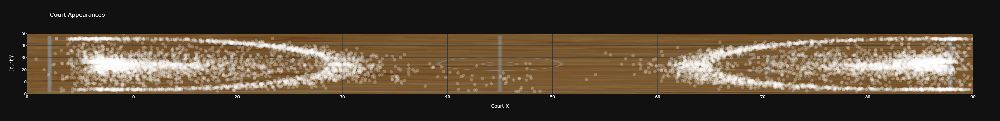

In [192]:
import plotly.graph_objs as go
from plotly.offline import iplot
import pandas as pd

# Assuming you have the required data in the 'data' DataFrame.
# Replace 'data' with the actual name of your DataFrame.

temp = df.loc[(df.annotation_code == "s") & (df.is_oreb == 1)].reset_index(drop = True)
# Create a scatter plot
trace = go.Scatter(
    x=temp['court_x'],
    y=temp['court_y'],
    mode='markers+text',  # Show markers and text annotations
 # Position the annotations below the data points
    marker=dict(size=10, color='white', opacity=0.25),  # Adjust size and color of markers
)

layout = go.Layout(
    title='Court Appearances',
    xaxis=dict(title='Court X', range=[0, 90]),  # Set the range for the x-axis
    yaxis=dict(title='Court Y', range=[0, 50]),  # Set the range for the y-axis
    template='plotly_dark',
)
fig = go.Figure(data=[trace], layout=layout)

fig.add_layout_image(
        dict(
            source="https://muralsyourway.vtexassets.com/arquivos/ids/236597-825-auto?width=825&height=auto&aspect=true",
            xref="x",
            yref="y",
            x=0,
            y=50,
            sizex=90,
            sizey=50,
            sizing="stretch",
            opacity=0.5,
            layer="below")
)


iplot(fig)


### Court Positions of Shooters which resulted with Defensive Rebound

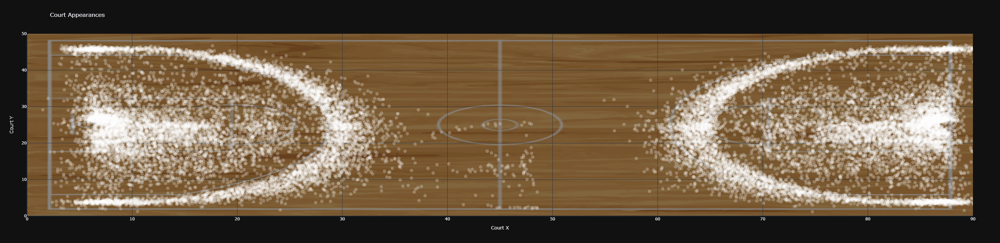

In [193]:
import plotly.graph_objs as go
from plotly.offline import iplot
import pandas as pd

# Assuming you have the required data in the 'data' DataFrame.
# Replace 'data' with the actual name of your DataFrame.

temp = df.loc[(df.annotation_code == "s") & (df.is_oreb == 0)].reset_index(drop = True)
# Create a scatter plot
trace = go.Scatter(
    x=temp['court_x'],
    y=temp['court_y'],
    mode='markers+text',  # Show markers and text annotations
 # Position the annotations below the data points
    marker=dict(size=10, color='white', opacity=0.25),  # Adjust size and color of markers
)

layout = go.Layout(
    title='Court Appearances',
    xaxis=dict(title='Court X', range=[0, 90]),  # Set the range for the x-axis
    yaxis=dict(title='Court Y', range=[0, 50]),  # Set the range for the y-axis
    template='plotly_dark',
)
fig = go.Figure(data=[trace], layout=layout)

fig.add_layout_image(
        dict(
            source="https://muralsyourway.vtexassets.com/arquivos/ids/236597-825-auto?width=825&height=auto&aspect=true",
            xref="x",
            yref="y",
            x=0,
            y=50,
            sizex=90,
            sizey=50,
            sizing="stretch",
            opacity=0.5,
            layer="below")
)


iplot(fig)


#### **Distribution of Shot Locations Analysis:** 
- The densest cluster of shots is observed close to the basket and beyond the center arc for a 3-pointer.
- Mid-distance shots are relatively rare.
- Notably, there's a higher miss rate on the left side near the basket on one half of the court.
- Given our understanding of basketball, the specific basket a team targets shouldn't significantly impact shot choices.
- This highlights the constraints of our dataset's size, emphasizing the need for caution to avoid overfitting during model trials.






### Remaking the scene of the first play 2-2

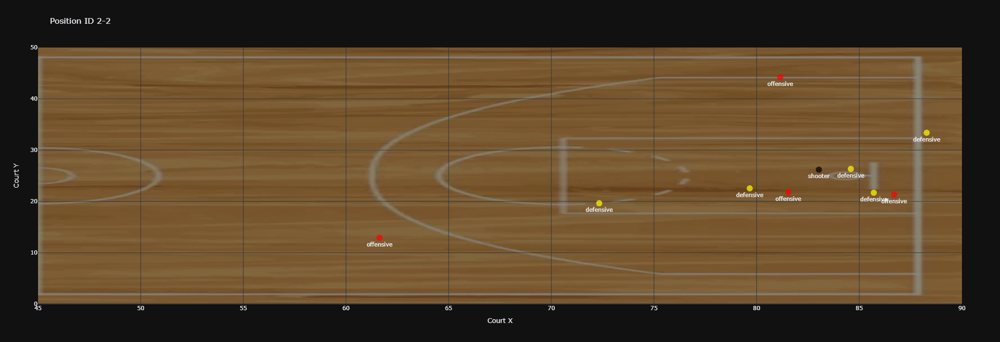

In [17]:
import plotly.graph_objs as go
from plotly.offline import iplot
import pandas as pd

# Assuming you have the required data in the 'data' DataFrame.
# Replace 'data' with the actual name of your DataFrame.
df = pd.read_csv('df_locs_Without_merge.csv')
temp = df[(df['game_id'] == 14921105216301) & (df['play_id'] == 249)]

# Create a scatter plot
trace = go.Scatter(
    x=temp['court_x'],
    y=temp['court_y'],
    text=temp['side'],
    textposition='bottom center',
    mode='markers+text',
    marker=dict(size=13, opacity=0.7),
)

# Set the color of the markers based on the 'annotation_code'
colors = {'defensive': 'yellow', 'defensive': 'yellow', 'defensive': 'yellow', 'defensive': 'yellow', 'defensive': 'yellow', 'offensive': 'red', 'offensive': 'red', 'offensive': 'red', 'offensive': 'red', 'shooter': 'black'}
trace.marker.color = [colors[code] for code in temp['side']]

layout = go.Layout(
    title='Position ID 2-2',
    xaxis=dict(title='Court X', range=[45, 90]),
    yaxis=dict(title='Court Y', range=[0, 50]),
    template='plotly_dark',
)
fig = go.Figure(data=[trace], layout=layout)

fig.add_layout_image(
    dict(
        source="https://muralsyourway.vtexassets.com/arquivos/ids/236597-825-auto?width=825&height=auto&aspect=true",
        xref="x",
        yref="y",
        x=0,
        y=50,
        sizex=90,
        sizey=50,
        sizing="stretch",
        opacity=0.5,
        layer="below")
)

iplot(fig)


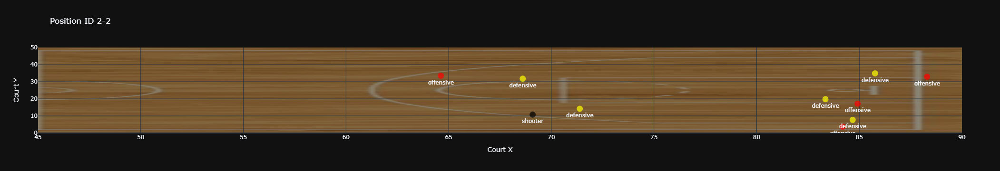

In [13]:
import plotly.graph_objs as go
from plotly.offline import iplot
import pandas as pd

# Assuming you have the required data in the 'data' DataFrame.
# Replace 'data' with the actual name of your DataFrame.
#df = pd.read_csv('df_locs_Without_merge.csv')
temp = df[(df['game_id'] == 18591006511491) & (df['play_id'] == 176)]

# Create a scatter plot
trace = go.Scatter(
    x=temp['court_x'],
    y=temp['court_y'],
    text=temp['side'],
    textposition='bottom center',
    mode='markers+text',
    marker=dict(size=13, opacity=0.7),
)

# Set the color of the markers based on the 'annotation_code'
colors = {'defensive': 'yellow', 'defensive': 'yellow', 'defensive': 'yellow', 'defensive': 'yellow', 'defensive': 'yellow', 'offensive': 'red', 'offensive': 'red', 'offensive': 'red', 'offensive': 'red', 'shooter': 'black'}
trace.marker.color = [colors[code] for code in temp['side']]

layout = go.Layout(
    title='Position ID 2-2',
    xaxis=dict(title='Court X', range=[45, 90]),
    yaxis=dict(title='Court Y', range=[0, 50]),
    template='plotly_dark',
)
fig = go.Figure(data=[trace], layout=layout)

fig.add_layout_image(
    dict(
        source="https://muralsyourway.vtexassets.com/arquivos/ids/236597-825-auto?width=825&height=auto&aspect=true",
        xref="x",
        yref="y",
        x=0,
        y=50,
        sizex=90,
        sizey=50,
        sizing="stretch",
        opacity=0.5,
        layer="below")
)

iplot(fig)

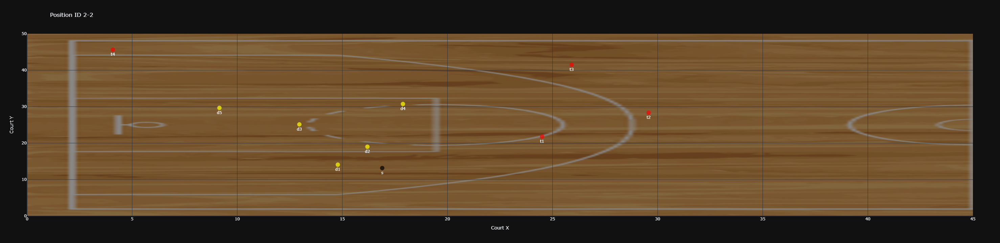

In [231]:
import plotly.graph_objs as go
from plotly.offline import iplot
import pandas as pd

# Assuming you have the required data in the 'data' DataFrame.
# Replace 'data' with the actual name of your DataFrame.

temp = df[10:20]

# Create a scatter plot
trace = go.Scatter(
    x=temp['court_x'],
    y=temp['court_y'],
    text=temp['annotation_code'],
    textposition='bottom center',
    mode='markers+text',
    marker=dict(size=13, opacity=0.7),
)

# Set the color of the markers based on the 'annotation_code'
colors = {'d1': 'yellow', 'd2': 'yellow', 'd3': 'yellow', 'd4': 'yellow', 'd5': 'yellow', 't1': 'red', 't2': 'red', 't3': 'red', 't4': 'red', 's': 'black'}
trace.marker.color = [colors[code] for code in temp['annotation_code']]

layout = go.Layout(
    title='Position ID 2-2',
    xaxis=dict(title='Court X', range=[0, 45]),
    yaxis=dict(title='Court Y', range=[0, 50]),
    template='plotly_dark',
)
fig = go.Figure(data=[trace], layout=layout)

fig.add_layout_image(
    dict(
        source="https://muralsyourway.vtexassets.com/arquivos/ids/236597-825-auto?width=825&height=auto&aspect=true",
        xref="x",
        yref="y",
        x=0,
        y=50,
        sizex=90,
        sizey=50,
        sizing="stretch",
        opacity=0.5,
        layer="below")
)

iplot(fig)


### Who is guarding who?

In [5]:
import pandas as pd
df = pd.read_csv('2021_2024_pbp_locs.csv')



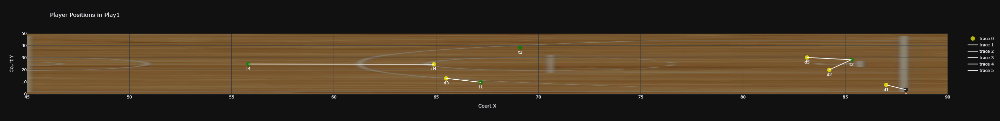

In [12]:
import plotly.graph_objs as go
from plotly.offline import iplot
import pandas as pd

# Assuming you have the required data in the 'data' DataFrame.
# Replace 'data' with the actual name of your DataFrame.

temp = df[20:30]

# Create a scatter plot
trace_scatter = go.Scatter(
    x=temp['court_x'],
    y=temp['court_y'],
    text=temp['annotation_code'],
    textposition='bottom center',
    mode='markers+text',
    marker=dict(size=13, opacity=0.7),
)

# Set the color of the markers based on the 'annotation_code'
colors = {'d1': 'yellow', 'd2': 'yellow', 'd3': 'yellow', 'd4': 'yellow', 'd5': 'yellow', 't1': 'green', 't2': 'green', 't3': 'green', 't4': 'green', 's': 'black'}
trace_scatter.marker.color = [colors[code] for code in temp['annotation_code']]

# Create traces for the lines between players
lines = []
for d_player in ['d1', 'd2', 'd3', 'd4', 'd5']:
    d_row = temp.loc[temp['annotation_code'] == d_player]  # Use loc for label-based indexing
    d_x = pd.to_numeric(d_row.at[d_row.index[0], 'court_x'])  # Convert to numeric
    d_y = pd.to_numeric(d_row.at[d_row.index[0], 'court_y'])  # Convert to numeric
    
    # Reset the index of the DataFrame for the min function
    temp_reset = temp[temp['annotation_code'].isin(['t1', 't2', 't3', 't4', 's'])].reset_index(drop=True)
    
    # Calculate the closest 't' or 's' player to the current 'd' player
    distances = ((d_x - pd.to_numeric(temp_reset['court_x']))**2 + (d_y - pd.to_numeric(temp_reset['court_y']))**2)**0.5
    closest_index = distances.idxmin()
    closest_x = pd.to_numeric(temp_reset.at[closest_index, 'court_x'])
    closest_y = pd.to_numeric(temp_reset.at[closest_index, 'court_y'])
    
    lines.append(go.Scatter(
        x=[d_x, closest_x],
        y=[d_y, closest_y],
        mode='lines',
        line=dict(color='white', width=2),
        hoverinfo='none'
    ))

layout = go.Layout(
    title='Player Positions in Play1',
    xaxis=dict(title='Court X', range=[45, 90]),
    yaxis=dict(title='Court Y', range=[0, 50]),
    template='plotly_dark',
)

fig = go.Figure(data=[trace_scatter, *lines], layout=layout)

fig.add_layout_image(
    dict(
        source="https://muralsyourway.vtexassets.com/arquivos/ids/236597-825-auto?width=825&height=auto&aspect=true",
        xref="x",
        yref="y",
        x=0,
        y=50,
        sizex=90,
        sizey=50,
        sizing="stretch",
        opacity=0.5,
        layer="below")
)

iplot(fig)


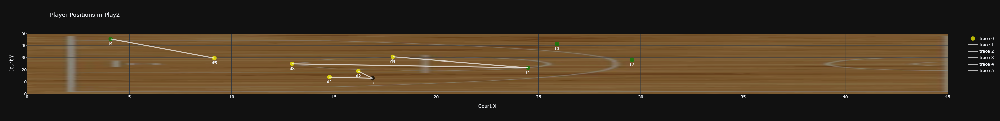

In [11]:
import plotly.graph_objs as go
from plotly.offline import iplot
import pandas as pd

# Assuming you have the required data in the 'data' DataFrame.
# Replace 'data' with the actual name of your DataFrame.

temp = df[10:20]

# Create a scatter plot
trace_scatter = go.Scatter(
    x=temp['court_x'],
    y=temp['court_y'],
    text=temp['annotation_code'],
    textposition='bottom center',
    mode='markers+text',
    marker=dict(size=13, opacity=0.7),
)

# Set the color of the markers based on the 'annotation_code'
colors = {'d1': 'yellow', 'd2': 'yellow', 'd3': 'yellow', 'd4': 'yellow', 'd5': 'yellow', 't1': 'green', 't2': 'green', 't3': 'green', 't4': 'green', 's': 'black'}
trace_scatter.marker.color = [colors[code] for code in temp['annotation_code']]

# Create traces for the lines between players
lines = []
for d_player in ['d1', 'd2', 'd3', 'd4', 'd5']:
    d_row = temp.loc[temp['annotation_code'] == d_player]  # Use loc for label-based indexing
    d_x = pd.to_numeric(d_row.at[d_row.index[0], 'court_x'])  # Convert to numeric
    d_y = pd.to_numeric(d_row.at[d_row.index[0], 'court_y'])  # Convert to numeric
    
    # Reset the index of the DataFrame for the min function
    temp_reset = temp[temp['annotation_code'].isin(['t1', 't2', 't3', 't4', 's'])].reset_index(drop=True)
    
    # Calculate the closest 't' or 's' player to the current 'd' player
    distances = ((d_x - pd.to_numeric(temp_reset['court_x']))**2 + (d_y - pd.to_numeric(temp_reset['court_y']))**2)**0.5
    closest_index = distances.idxmin()
    closest_x = pd.to_numeric(temp_reset.at[closest_index, 'court_x'])
    closest_y = pd.to_numeric(temp_reset.at[closest_index, 'court_y'])
    
    lines.append(go.Scatter(
        x=[d_x, closest_x],
        y=[d_y, closest_y],
        mode='lines',
        line=dict(color='rgba(255, 255, 255, 0.7)', width=3),  # Adjust color and width here
        hoverinfo='none'
    ))

layout = go.Layout(
    title='Player Positions in Play2',
    xaxis=dict(title='Court X', range=[0, 45]),
    yaxis=dict(title='Court Y', range=[0, 50]),
    template='plotly_dark',
)

fig = go.Figure(data=[trace_scatter, *lines], layout=layout)

fig.add_layout_image(
    dict(
        source="https://muralsyourway.vtexassets.com/arquivos/ids/236597-825-auto?width=825&height=auto&aspect=true",
        xref="x",
        yref="y",
        x=0,
        y=50,
        sizex=90,
        sizey=50,
        sizing="stretch",
        opacity=0.5,
        layer="below")
)

iplot(fig)


In [13]:
df

,id,is_oreb,team,opponent,conference,opp_conference,dataset,court_x,court_y,annotation_code
0,2-2,0.0,Kentucky,Duke,SEC,ACC,train,72.807686,37.409669,d1
1,2-2,0.0,Kentucky,Duke,SEC,ACC,train,79.080643,31.477796,d2
2,2-2,0.0,Kentucky,Duke,SEC,ACC,train,69.956321,24.467300,d3
3,2-2,0.0,Kentucky,Duke,SEC,ACC,train,75.468933,13.861763,d4
4,2-2,0.0,Kentucky,Duke,SEC,ACC,train,84.973496,19.254422,d5
...,...,...,...,...,...,...,...,...,...,...
440065,607-3,NaN,William & Mary,Old Dominion,Colonial,Conference USA,test,29.603203,18.856744,s
440066,607-3,NaN,William & Mary,Old Dominion,Colonial,Conference USA,test,28.389761,5.307346,t1
440067,607-3,NaN,William & Mary,Old Dominion,Colonial,Conference USA,test,28.389761,35.904947,t2
440068,607-3,NaN,William & Mary,Old Dominion,Colonial,Conference USA,test,19.174531,42.347222,t3


## Feature Engineering

In [5]:
df = pd.merge(pd.concat([train_pbp, test_pbp]), pd.concat([train_locs, test_locs]), on = ["dataset", "id"])
train_df = df.loc[(df.dataset == "train")]
test_df = df.loc[(df.dataset == "test")]

In [6]:
def process_basketball_data(df):
    # Assign "shooter" to "side" where annotation_code is "s"
    df.loc[df.annotation_code == "s", "side"] = "shooter"
    
    # Assign "defensive" to "side" where annotation_code starts with "d"
    df.loc[df.annotation_code.astype(str).str.startswith("d"), "side"] = "defensive"
    
    # Fill NaN values in "annotation_code" with "offensive"
    df.side.fillna("offensive", inplace=True)
    
    # Drop the "annotation_code" column
    df = df.drop(["annotation_code"], axis=1)
    
    # Set "in_right" to 1 where "court_x" is greater than 47
    df.loc[df.court_x > 47, "in_right"] = int(1)
    
    # Calculate the total number of defensive and offensive players on each team
    for position in ['defensive', 'offensive']:
        df[f'in_right_{position}_total'] = df.loc[df.side == position].groupby("id")["in_right"].transform("sum")
        df[f'in_left_{position}_total'] = 5 - df[f'in_right_{position}_total']
    
    # Set "shooter_in_right" to 1 where "side" is "shooter" and "in_right" is 1
    df.loc[(df.side == "shooter") & (df.in_right == 1), "shooter_in_right"] = 1
    
    # Calculate maximum values for specific columns within each group of "id"
    for i in ['in_right_defensive_total', 'in_left_defensive_total', 'in_right_offensive_total',
              'in_left_offensive_total', 'shooter_in_right']:
        df[i] = df.groupby(["id"])[i].transform("max")
    
    # Fill NaN values with 0
    df.fillna(0, inplace=True)
    
    return df

df = process_basketball_data(df)  


In [80]:
df.head()

,id,is_oreb,team,opponent,conference,opp_conference,dataset,court_x,court_y,side,in_right,in_right_defensive_total,in_left_defensive_total,in_right_offensive_total,in_left_offensive_total,shooter_in_right
0,2-2,0.0,Kentucky,Duke,SEC,ACC,train,72.807686,37.409669,defensive,1.0,5.0,0.0,4.0,1.0,1.0
1,2-2,0.0,Kentucky,Duke,SEC,ACC,train,79.080643,31.477796,defensive,1.0,5.0,0.0,4.0,1.0,1.0
2,2-2,0.0,Kentucky,Duke,SEC,ACC,train,69.956321,24.467300,defensive,1.0,5.0,0.0,4.0,1.0,1.0
3,2-2,0.0,Kentucky,Duke,SEC,ACC,train,75.468933,13.861763,defensive,1.0,5.0,0.0,4.0,1.0,1.0
4,2-2,0.0,Kentucky,Duke,SEC,ACC,train,84.973496,19.254422,defensive,1.0,5.0,0.0,4.0,1.0,1.0


### Difference in Numbers (difference in offensive and defensive players positioning on the court)

In [7]:
def calculate_difference(row):
    if row["shooter_in_right"] == 1:
        return row["in_right_defensive_total"] - row["in_right_offensive_total"]
    else:
        return row["in_left_defensive_total"] - row["in_left_offensive_total"]
df["difference_in_numbers"] = df.apply(calculate_difference, axis=1)

In [8]:
data = df.loc[(df.dataset == "train")].drop_duplicates("id").reset_index(drop = True)
temp = data.groupby("difference_in_numbers")["is_oreb"].mean().reset_index()
temp.columns = ["difference_in_numbers", "offensive_rebound_percentage"]

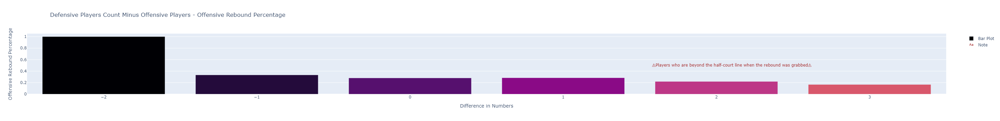

In [56]:
# Custom color palette
custom_colors = ['#000004', '#240b3b', '#56106e', '#8a0a86', '#bd3786', '#d8576b', '#f07549', '#fc8d59']

# Create the bar plot with the custom color palette
fig = go.Figure(data=[go.Bar(x=temp.difference_in_numbers, y=temp.offensive_rebound_percentage, marker=dict(color=custom_colors), name='Bar Plot')])

# Update layout with labels and title
fig.update_layout(
    title='Defensive Players Count Minus Offensive Players - Offensive Rebound Percentage',
    xaxis_title='Difference in Numbers',
    yaxis_title='Offensive Rebound Percentage'
)
fig.add_trace(go.Scatter(x=[2.1], y=[0.5], mode='text', text=["\u26A0Players who are beyond the half-court line when the rebound was grabbed\u26A0"],name = "Note",textfont=dict(color='Brown')))

# Show the plot
fig.show()


**Of course we won't expect 100% offensive rebound when the equation resulted as -2, but it's enough to tell us that this feature can play a huge role in predicting OFFREB%**

### **Calculating Distance Features**

Baskets Coordinates: 
   - Left Hoop: Located at `(4,25)`.
   - Right Hoop: Located at `(90,25)`.
    
    These will act as reference points for our distance calculations.


### Distance from Hoop features

In [9]:
def calculate_distances(df):
    df["right_hoop_x"] = 90; df["hoop_y"] = 25; df["left_hoop_x"] = 4

    df["x_abs_diff_right"] = abs(df["court_x"] - df["right_hoop_x"]); df["x_abs_diff_left"] = abs(df["court_x"] - df["left_hoop_x"])
    df["y_abs_diff"] = abs(df["court_y"] - df["hoop_y"])
    
    df["distance_right"] = np.sqrt((df["x_abs_diff_right"] ** 2) + (df["y_abs_diff"] ** 2))
    df["distance_left"] = np.sqrt((df["x_abs_diff_left"] ** 2) + (df["y_abs_diff"] ** 2))
    
    return df

def process_dataframe(df):
    df.loc[(df.side == "shooter") & (df.in_right == 1), "ball_side"] = "right"
    df.loc[(df.side == "shooter") & (df.in_right == 0), "ball_side"] = "left"
    
    df["ball_side"] = df.groupby("id")["ball_side"].fillna(method="bfill").fillna(method="ffill")
    
    df.loc[df["ball_side"] == "right", "distance"] = df.loc[df["ball_side"] == "right", "distance_right"]
    df.loc[df["ball_side"] == "left", "distance"] = df.loc[df["ball_side"] == "left", "distance_left"]
    
    df.loc[df.side == "defensive", "def_avg_distance"] = df.loc[df.side == "defensive"].groupby("id")["distance"].transform("mean")
    df.loc[df.side == "offensive", "offensive_avg_distance"] = df.loc[df.side == "offensive"].groupby("id")["distance"].transform("mean")

    for i in ["def_avg_distance", "offensive_avg_distance"]:
        df[i] = df.groupby("id")[i].transform("max")
    
    return df

def cluster_hoop_distances(df, num_intervals=5):
    qcut_result, bins = pd.qcut(df['def_avg_distance'], num_intervals, retbins=True, labels=False)
    qcut_result2, bins2 = pd.qcut(df['offensive_avg_distance'], num_intervals, retbins=True, labels=False)

    df['d_distance_from_hoop_class'] = qcut_result
    df['t_distance_from_hoop_class'] = qcut_result2
    df["distance_difference"] = df["def_avg_distance"] - df["offensive_avg_distance"]
    qcut_result3, bins3 = pd.qcut(df['distance_difference'], num_intervals, retbins=True, labels=False)
    df["distance_difference_class"] = qcut_result3

    
    return df

In [10]:
df = calculate_distances(df)
df = process_dataframe(df)
df = cluster_hoop_distances(df, num_intervals=3)

In [55]:
df.head()

,id,is_oreb,team,opponent,conference,opp_conference,dataset,court_x,court_y,side,...,distance_right,distance_left,ball_side,distance,def_avg_distance,offensive_avg_distance,d_distance_from_hoop_class,t_distance_from_hoop_class,distance_difference,distance_difference_class
0,2-2,0.0,Kentucky,Duke,SEC,ACC,train,72.807686,37.409669,defensive,...,21.203196,69.917791,right,21.203196,15.978589,19.469146,2,1,-3.490557,2
1,2-2,0.0,Kentucky,Duke,SEC,ACC,train,79.080643,31.477796,defensive,...,12.696228,75.359570,right,12.696228,15.978589,19.469146,2,1,-3.490557,2
2,2-2,0.0,Kentucky,Duke,SEC,ACC,train,69.956321,24.467300,defensive,...,20.050756,65.958473,right,20.050756,15.978589,19.469146,2,1,-3.490557,2
3,2-2,0.0,Kentucky,Duke,SEC,ACC,train,75.468933,13.861763,defensive,...,18.308802,72.331658,right,18.308802,15.978589,19.469146,2,1,-3.490557,2
4,2-2,0.0,Kentucky,Duke,SEC,ACC,train,84.973496,19.254422,defensive,...,7.633964,81.177082,right,7.633964,15.978589,19.469146,2,1,-3.490557,2


In [12]:
temp = df.loc[(df.dataset == "train")].drop_duplicates(subset = "id").reset_index(drop = True)
plot1 = temp.groupby(["t_distance_from_hoop_class"])["is_oreb"].mean().reset_index()
plot2 = temp.groupby(["distance_difference_class"])["is_oreb"].mean().reset_index()

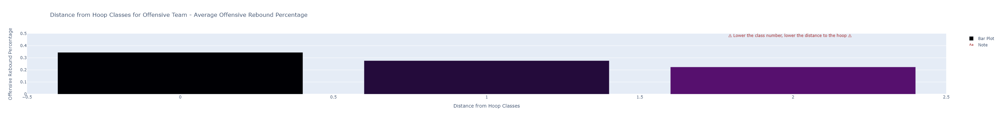

In [240]:
# Custom color palette
custom_colors = ['#000004', '#240b3b', '#56106e', '#8a0a86', '#bd3786', '#d8576b', '#f07549', '#fc8d59']

# Create the bar plot with the custom color palette
fig = go.Figure(data=[go.Bar(x=plot1.t_distance_from_hoop_class, y=plot1.is_oreb, marker=dict(color=custom_colors), name='Bar Plot')])
fig.add_trace(go.Scatter(x=[1.99], y=[0.48], mode='text', text=["\u26A0 Lower the class number, lower the distance to the hoop \u26A0"],name = "Note",textfont=dict(color='Brown')))
# Update layout with labels and title
layout = go.Layout(
    xaxis=dict(title='Court X', range=[0, 2]),
    yaxis=dict(title='Court Y', range=[0, 0.5]),
    template='plotly_dark',
)
fig.update_layout(
    title='Distance from Hoop Classes for Offensive Team - Average Offensive Rebound Percentage',
    xaxis_title='Distance from Hoop Classes',
    yaxis=dict(title='Offensive Rebound Percentage', range=[0, 0.5])
)

# Show the plot
fig.show()


***When the offensive team is closer to the basket, the probability of getting an offensive rebound seems to be higher, as observed***

What about finding the difference between defensive team and offensive team in terms of hoop distance? 

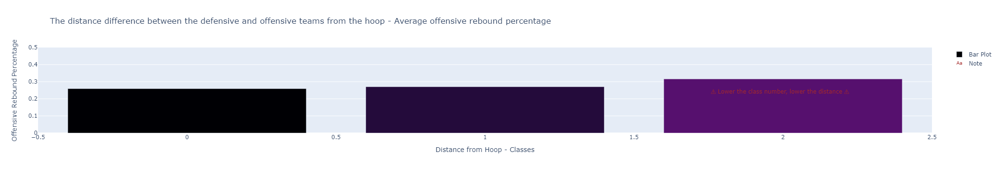

In [241]:
# Custom color palette
custom_colors = ['#000004', '#240b3b', '#56106e', '#8a0a86', '#bd3786', '#d8576b', '#f07549', '#fc8d59']

# Create the bar plot with the custom color palette
fig = go.Figure(data=[go.Bar(x=plot2.distance_difference_class, y=plot2.is_oreb, marker=dict(color=custom_colors), name='Bar Plot')])
fig.add_trace(go.Scatter(x=[1.99], y=[0.24], mode='text', text=["\u26A0 Lower the class number, lower the distance \u26A0"],name = "Note",textfont=dict(color='Brown')))
# Update layout with labels and title
layout = go.Layout(
    xaxis=dict(title='Court X', range=[0, 2]),
    yaxis=dict(title='Court Y', range=[0, 0.5]),
    template='plotly_dark',
)
fig.update_layout(
    title='The distance difference between the defensive and offensive teams from the hoop - Average offensive rebound percentage',
    xaxis_title='Distance from Hoop - Classes',
    yaxis=dict(title='Offensive Rebound Percentage', range=[0, 0.5])
)

# Show the plot
fig.show()


**The graph clearly shows that if the defensive team's average proximity to the hoop is less than that of the offensive team, the odds of securing an offensive rebound diminish. On the other hand, when the offensive team is nearer to the hoop compared to the defensive side (that is, as the difference grows), the chances of grabbing an offensive rebound rise notably.**

**Let's take a look at bin intervals as well to understand it better**

In [242]:
pd.qcut(df['distance_difference'], 3)

0          (-5.073, 15.14]
1          (-5.073, 15.14]
2          (-5.073, 15.14]
3          (-5.073, 15.14]
4          (-5.073, 15.14]
                ...       
440065    (-7.879, -5.073]
440066    (-7.879, -5.073]
440067    (-7.879, -5.073]
440068    (-7.879, -5.073]
440069    (-7.879, -5.073]
Name: distance_difference, Length: 440070, dtype: category
Categories (3, interval[float64]): [(-61.241, -7.879] < (-7.879, -5.073] < (-5.073, 15.14]]

**Distance difference values ranging from -61.241 to -7.879 will be classified as 0. Positions with a distance difference between -7.879 and -5.073 will be classified as 1, while the remaining values will fall into class 2.**

**For clarity, imagine a situation where the defensive team's average distance to the hoop is 20 units, and the offensive team's is 60 units. The gap between these averages is -40 units, which we categorize as 0. Naturally, when the defensive team is nearer to the hoop, they're more likely to recover the ball.**

**On the flip side, if we swap the distance values, we get a positive difference of 40 units, categorized as 2. Here, with the offensive team being closer to the hoop, the chances of them capturing the offensive rebound increase. This trend is evident in the graph, reinforcing our initial assumptions.**

******

### Players Distances to the Shooter

In [11]:
df["shooter_x"] = df.loc[(df.side == "shooter"), "court_x"]
df["shooter_y"] = df.loc[(df.side == "shooter"), "court_y"]

for col in ["shooter_x", "shooter_y"]:
    df[col] = df.groupby("id")[col].transform("max")
df["x_diff_from_shooter"] = abs(df["court_x"] - df.shooter_x)
df["y_diff_from_shooter"] = abs(df["court_y"] - df.shooter_y)
df["distance_from_shooter"] = np.sqrt(((df.x_diff_from_shooter)**2) + (df.y_diff_from_shooter)**2)

## Defensive player distances to the shooter

In [12]:
# Sort the dataframe by 'id' and 'distance_from_shooter'
df_sorted = df.loc[(df.side == "defensive")].sort_values(by=['id', 'distance_from_shooter'])

# Group the dataframe by 'id' and get the second and third least distances using aggregate function
result = df_sorted.groupby('id')['distance_from_shooter'].agg(lambda x: x.iloc[0:].tolist()).reset_index()

print(result)

          id                              distance_from_shooter
0        1-1  [4.784871978003136, 10.746653035580659, 11.028...
1       10-1  [1.6921495131436506, 6.600909782298502, 6.7967...
2      10-10  [13.789983750941094, 13.956004655895873, 16.28...
3      10-11  [7.545243224443903, 17.287593090061854, 18.456...
4      10-12  [1.8801211482440232, 1.955705051313284, 10.531...
...      ...                                                ...
44002  999-5  [6.4213894801720075, 9.843009412330382, 19.153...
44003  999-6  [7.534481252110407, 15.480049217339118, 18.415...
44004  999-7  [6.5237312558388165, 13.995955770849163, 21.46...
44005  999-8  [2.7306373200998224, 7.451337873456133, 13.496...
44006  999-9  [4.578320614507685, 11.952915426152448, 14.958...

[44007 rows x 2 columns]


In [13]:
# Merge the original dataframe with the closest and second closest distances
result.columns = ['id', 'distance_to_shooter']
df = df.merge(result, on='id')

# Extract closest and second closest distances into separate columns
df['defplayer_closest_distance'] = df['distance_to_shooter'].apply(lambda x: x[0])
df['defplayer_second_closest_distance'] = df['distance_to_shooter'].apply(lambda x: x[1])
df['defplayer_third_closest_distance'] = df['distance_to_shooter'].apply(lambda x: x[2])
df['defplayer_fourth_closest_distance'] = df['distance_to_shooter'].apply(lambda x: x[3])
df['defplayer_fifth_closest_distance'] = df['distance_to_shooter'].apply(lambda x: x[4])

## Offensive player distance to the shooter

In [14]:
# Sort the dataframe by 'id' and 'distance_from_shooter'
df_sorted = df.loc[(df.side == "offensive")].sort_values(by=['id', 'distance_from_shooter'])

# Group the dataframe by 'id' and get the second and third least distances using aggregate function
result = df_sorted.groupby('id')['distance_from_shooter'].agg(lambda x: x.iloc[0:].tolist()).reset_index()

print(result)

          id                              distance_from_shooter
0        1-1  [8.960596404677927, 16.64963583790253, 17.5791...
1       10-1  [4.2386020260336625, 15.671942475791438, 23.09...
2      10-10  [11.69583140077883, 18.4723582908853, 24.82940...
3      10-11  [9.187210464729151, 17.801179947504117, 21.355...
4      10-12  [15.3190554923226, 19.339874251409185, 21.1371...
...      ...                                                ...
44002  999-5  [20.416868649764915, 21.518354325660606, 34.73...
44003  999-6  [24.76832039746416, 33.92074474295692, 41.8674...
44004  999-7  [22.666627348896725, 26.274772559392215, 30.65...
44005  999-8  [10.19334231391391, 11.864847869188003, 20.898...
44006  999-9  [8.095928772524978, 17.212321137001638, 32.285...

[44007 rows x 2 columns]


In [15]:
# Merge the original dataframe with the closest and second closest distances
result.columns = ['id', 'distance_to_shooter_y']
df = df.merge(result, on='id')

# Extract closest and second closest distances into separate columns
df['offplayer_closest_distance'] = df['distance_to_shooter_y'].apply(lambda x: x[0])
df['offplayer_second_closest_distance'] = df['distance_to_shooter_y'].apply(lambda x: x[1])
df['offplayer_third_closest_distance'] = df['distance_to_shooter_y'].apply(lambda x: x[2])
df['offplayer_fourth_closest_distance'] = df['distance_to_shooter_y'].apply(lambda x: x[3])

In [16]:
df = df.drop(["distance_to_shooter","distance_to_shooter_y"] ,1)


## Closest 5 offensive players to hoop

In [17]:
df["closest_to_attacking_hoop"] = np.sqrt((df["court_x"] - df["right_hoop_x"])**2 + (df["court_y"] - df["hoop_y"])**2)
df.loc[df["side"] == "offensive", "closest_to_attacking_hoop"] = np.sqrt((df["court_x"] - df["left_hoop_x"])**2 + (df["court_y"] - df["hoop_y"])**2)

# Sort the DataFrame by 'id' and 'closest_to_attacking_hoop'
df_sorted = df.sort_values(by=["id", "closest_to_attacking_hoop"])

# Group the DataFrame by 'id' and get the four closest distances using the aggregate function
result = df_sorted.groupby("id")["closest_to_attacking_hoop"].apply(lambda x: x.iloc[:4].tolist()).reset_index()

# Merge the original DataFrame with the closest distances
result.columns = ["id", "distance_to_hoop"]
df = df.merge(result, on="id")

# Extract closest distances into separate columns
df["offplayer_closest_distance_to_hoop"] = df["distance_to_hoop"].apply(lambda x: x[0])
df["offplayer_second_closest_distance_to_hoop"] = df["distance_to_hoop"].apply(lambda x: x[1])
df["offplayer_third_closest_distance_to_hoop"] = df["distance_to_hoop"].apply(lambda x: x[2])
df["offplayer_fourth_closest_distance_to_hoop"] = df["distance_to_hoop"].apply(lambda x: x[3])

# Drop the temporary column
df.drop("closest_to_attacking_hoop", axis=1, inplace=True)
df.drop("distance_to_hoop", axis=1, inplace=True)

## Closest 5 defensive players to hoop

In [18]:
df["closest_to_attacking_hoop"] = np.sqrt((df["court_x"] - df["right_hoop_x"])**2 + (df["court_y"] - df["hoop_y"])**2)
df.loc[df["side"] == "defensive", "closest_to_attacking_hoop"] = np.sqrt((df["court_x"] - df["left_hoop_x"])**2 + (df["court_y"] - df["hoop_y"])**2)

# Sort the DataFrame by 'id' and 'closest_to_attacking_hoop'
df_sorted = df.sort_values(by=["id", "closest_to_attacking_hoop"])

# Group the DataFrame by 'id' and get the four closest distances using the aggregate function
result = df_sorted.groupby("id")["closest_to_attacking_hoop"].apply(lambda x: x.iloc[:4].tolist()).reset_index()

# Merge the original DataFrame with the closest distances
result.columns = ["id", "distance_to_hoop"]
df = df.merge(result, on="id")

# Extract closest distances into separate columns
df["defplayer_closest_distance_to_hoop"] = df["distance_to_hoop"].apply(lambda x: x[0])
df["defplayer_second_closest_distance_to_hoop"] = df["distance_to_hoop"].apply(lambda x: x[1])
df["defplayer_third_closest_distance_to_hoop"] = df["distance_to_hoop"].apply(lambda x: x[2])
df["defplayer_fourth_closest_distance_to_hoop"] = df["distance_to_hoop"].apply(lambda x: x[3])

# Drop the temporary column
df.drop("closest_to_attacking_hoop", axis=1, inplace=True)
df.drop("distance_to_hoop", axis=1, inplace=True)

In [ ]:
# for some reason it swaps the two - def is offense and off is defense. BUt doesnt matter since they are both included in features of model

In [389]:
df2 = df

In [175]:
df

,id,is_oreb,team,opponent,conference,opp_conference,dataset,court_x,court_y,side,in_right,in_right_defensive_total,in_left_defensive_total,in_right_offensive_total,in_left_offensive_total,shooter_in_right,difference_in_numbers,right_hoop_x,hoop_y,left_hoop_x,x_abs_diff_right,x_abs_diff_left,y_abs_diff,distance_right,distance_left,ball_side,distance,def_avg_distance,offensive_avg_distance,d_distance_from_hoop_class,t_distance_from_hoop_class,distance_difference,distance_difference_class,shooter_x,shooter_y,x_diff_from_shooter,y_diff_from_shooter,distance_from_shooter,offplayer_closest_distance,offplayer_second_closest_distance,offplayer_third_closest_distance,offplayer_fourth_closest_distance
0,2-2,0.0,Kentucky,Duke,SEC,ACC,train,72.807686,37.409669,defensive,1.0,5.0,0.0,4.0,1.0,1.0,1.0,90,25,4,17.192314,68.807686,12.409669,21.203196,69.917791,right,21.203196,15.978589,19.469146,2,1,-3.490557,2,69.994331,39.674616,2.813355,2.264947,3.611780,14.470138,25.450711,27.122761,29.059673
1,2-2,0.0,Kentucky,Duke,SEC,ACC,train,79.080643,31.477796,defensive,1.0,5.0,0.0,4.0,1.0,1.0,1.0,90,25,4,10.919357,75.080643,6.477796,12.696228,75.359570,right,12.696228,15.978589,19.469146,2,1,-3.490557,2,69.994331,39.674616,9.086311,8.196820,12.237194,14.470138,25.450711,27.122761,29.059673
2,2-2,0.0,Kentucky,Duke,SEC,ACC,train,69.956321,24.467300,defensive,1.0,5.0,0.0,4.0,1.0,1.0,1.0,90,25,4,20.043679,65.956321,0.532700,20.050756,65.958473,right,20.050756,15.978589,19.469146,2,1,-3.490557,2,69.994331,39.674616,0.038010,15.207316,15.207364,14.470138,25.450711,27.122761,29.059673
3,2-2,0.0,Kentucky,Duke,SEC,ACC,train,75.468933,13.861763,defensive,1.0,5.0,0.0,4.0,1.0,1.0,1.0,90,25,4,14.531067,71.468933,11.138237,18.308802,72.331658,right,18.308802,15.978589,19.469146,2,1,-3.490557,2,69.994331,39.674616,5.474602,25.812853,26.387017,14.470138,25.450711,27.122761,29.059673
4,2-2,0.0,Kentucky,Duke,SEC,ACC,train,84.973496,19.254422,defensive,1.0,5.0,0.0,4.0,1.0,1.0,1.0,90,25,4,5.026504,80.973496,5.745578,7.633964,81.177082,right,7.633964,15.978589,19.469146,2,1,-3.490557,2,69.994331,39.674616,14.979165,20.420194,25.325080,14.470138,25.450711,27.122761,29.059673
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
440065,607-3,0.0,William & Mary,Old Dominion,Colonial,Conference USA,test,29.603203,18.856744,shooter,0.0,0.0,5.0,0.0,5.0,0.0,0.0,90,25,4,60.396797,25.603203,6.143256,60.708424,26.329899,left,26.329899,16.002462,21.636976,2,2,-5.634514,1,29.603203,18.856744,0.000000,0.000000,0.000000,13.603625,17.091333,25.701357,28.787141
440066,607-3,0.0,William & Mary,Old Dominion,Colonial,Conference USA,test,28.389761,5.307346,offensive,0.0,0.0,5.0,0.0,5.0,0.0,0.0,90,25,4,61.610239,24.389761,19.692654,64.680926,31.347425,left,31.347425,16.002462,21.636976,2,2,-5.634514,1,29.603203,18.856744,1.213442,13.549398,13.603625,13.603625,17.091333,25.701357,28.787141
440067,607-3,0.0,William & Mary,Old Dominion,Colonial,Conference USA,test,28.389761,35.904947,offensive,0.0,0.0,5.0,0.0,5.0,0.0,0.0,90,25,4,61.610239,24.389761,10.904947,62.567878,26.716630,left,26.716630,16.002462,21.636976,2,2,-5.634514,1,29.603203,18.856744,1.213442,17.048203,17.091333,13.603625,17.091333,25.701357,28.787141
440068,607-3,0.0,William & Mary,Old Dominion,Colonial,Conference USA,test,19.174531,42.347222,offensive,0.0,0.0,5.0,0.0,5.0,0.0,0.0,90,25,4,70.825469,15.174531,17.347222,72.918950,23.047614,left,23.047614,16.002462,21.636976,2,2,-5.634514,1,29.603203,18.856744,10.428672,23.490478,25.701357,13.603625,17.091333,25.701357,28.787141


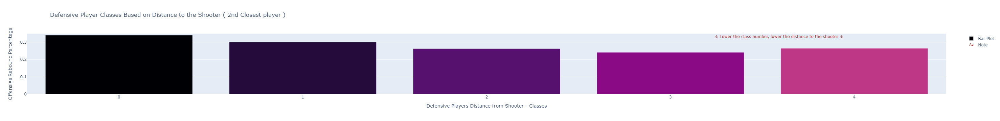

In [250]:
# Custom color palette
custom_colors = ['#000004', '#240b3b', '#56106e', '#8a0a86', '#bd3786', '#d8576b', '#f07549', '#fc8d59']

# Create the bar plot with the custom color palette
fig = go.Figure(data=[go.Bar(x=plot2.def_closest_distance2_segment, y=plot2.is_oreb, marker=dict(color=custom_colors), name='Bar Plot')])
fig.add_trace(go.Scatter(x=[3.59], y=[0.33], mode='text', text=["\u26A0 Lower the class number, lower the distance to the shooter \u26A0"],name = "Note",textfont=dict(color='Brown')))
# Update layout with labels and title
layout = go.Layout(
    xaxis=dict(title='Court X', range=[0, 0.35]),
    yaxis=dict(title='Court Y', range=[0, 5]),
    template='plotly_dark',
)
fig.update_layout(
    title='Defensive Player Classes Based on Distance to the Shooter ( 2nd Closest player )',
    xaxis_title='Defensive Players Distance from Shooter - Classes',
    yaxis=dict(title='Offensive Rebound Percentage', range=[0, 0.35])
)

# Show the plot
fig.show()


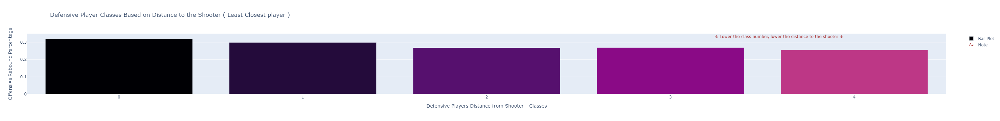

In [251]:
# Custom color palette
custom_colors = ['#000004', '#240b3b', '#56106e', '#8a0a86', '#bd3786', '#d8576b', '#f07549', '#fc8d59']

# Create the bar plot with the custom color palette
fig = go.Figure(data=[go.Bar(x=plot5.def_closest_distance5_segment, y=plot5.is_oreb, marker=dict(color=custom_colors), name='Bar Plot')])
fig.add_trace(go.Scatter(x=[3.59], y=[0.33], mode='text', text=["\u26A0 Lower the class number, lower the distance to the shooter \u26A0"],name = "Note",textfont=dict(color='Brown')))
# Update layout with labels and title
layout = go.Layout(
    xaxis=dict(title='Court X', range=[0, 0.35]),
    yaxis=dict(title='Court Y', range=[0, 5]),
    template='plotly_dark',
)
fig.update_layout(
    title='Defensive Player Classes Based on Distance to the Shooter ( Least Closest player )',
    xaxis_title='Defensive Players Distance from Shooter - Classes',
    yaxis=dict(title='Offensive Rebound Percentage', range=[0, 0.35])
)

# Show the plot
fig.show()


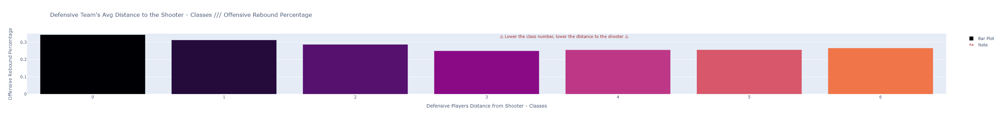

In [21]:
df["distance_from_shooter"] = np.sqrt(((df.x_diff_from_shooter)**2) + (df.y_diff_from_shooter)**2)
df["is_3_point_shot"] = (df.side == "shooter") & (df.distance >= 23.4)

df["avg_distance_to_shooter"] = df.loc[(df.side == "defensive")].groupby("id")["distance_from_shooter"].transform("mean")
df["avg_distance_to_shooter"] = df.groupby("id")["avg_distance_to_shooter"].transform("max")
temp = df.loc[(df.dataset == "train")].drop_duplicates(subset = "id").reset_index(drop = True)
num_intervals = 7  # Number of intervals you want to create
qcut_result, bins = pd.qcut(temp['avg_distance_to_shooter'], num_intervals, retbins=True, labels=False)

# Step 2: Extract the interval labels assigned by qcut for each row
temp['def_avg_distance_to_shooter'] = qcut_result
plot1 = temp.groupby(["def_avg_distance_to_shooter", "is_3_point_shot"])["is_oreb"].mean().reset_index()

# Custom color palette
custom_colors = ['#000004', '#240b3b', '#56106e', '#8a0a86', '#bd3786', '#d8576b', '#f07549', '#fc8d59']

# Create the bar plot with the custom color palette
fig = go.Figure(data=[go.Bar(x=plot1.def_avg_distance_to_shooter, y=plot1.is_oreb, marker=dict(color=custom_colors), name='Bar Plot')])
fig.add_trace(go.Scatter(x=[3.59], y=[0.33], mode='text', text=["\u26A0 Lower the class number, lower the distance to the shooter \u26A0"],name = "Note",textfont=dict(color='Brown')))
# Update layout with labels and title
layout = go.Layout(
    xaxis=dict(title='Court X', range=[0, 0.35]),
    yaxis=dict(title='Court Y', range=[0, 5]),
    template='plotly_dark',
)
fig.update_layout(
    title="Defensive Team's Avg Distance to the Shooter - Classes /// Offensive Rebound Percentage",
    xaxis_title='Defensive Players Distance from Shooter - Classes',
    yaxis=dict(title='Offensive Rebound Percentage', range=[0, 0.35])
)

# Show the plot
fig.show()


**It appears that when the defensive team's players are in close proximity to the shooter, the likelihood of obtaining the defensive rebound decreases**

*******

### Players Count in Restricted Area - added features

**In basketball, the "restricted area" (often referred to as the "restricted arc" or "charge circle") is a semi-circular arc drawn on the court floor that radiates from the center of the basket. **

In [19]:
#a = df.loc[(df.dataset == "train")][["id", "side", "distance", "is_oreb"]]
df.loc[(df.distance < 8.82*1.5), "near_restricted_area"] = 1

In [20]:
df["ra_def_player_sum"] = df.loc[df.side == "defensive"].groupby("id")["near_restricted_area"].transform("sum")
df["ra_off_player_sum"] = df.loc[(df.side == "offensive") | (df.side == "shooter")].groupby("id")["near_restricted_area"].transform("sum")

In [21]:
for col in ["ra_def_player_sum", "ra_off_player_sum"]:
    df[col] = df.groupby("id")[col].transform("max")

In [22]:
df["diff_in_ra"] = df.ra_def_player_sum - df.ra_off_player_sum

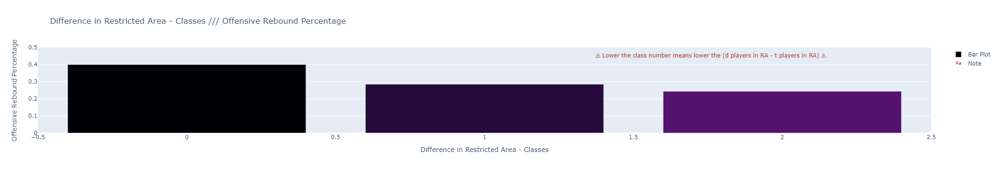

In [262]:
# Custom color palette
custom_colors = ['#000004', '#240b3b', '#56106e', '#8a0a86', '#bd3786', '#d8576b', '#f07549', '#fc8d59']

# Create the bar plot with the custom color palette
fig = go.Figure(data=[go.Bar(x=plot1.diff_ra_segment, y=plot1.is_oreb, marker=dict(color=custom_colors), name='Bar Plot')])
fig.add_trace(go.Scatter(x=[1.76], y=[0.45], mode='text', text=["\u26A0 Lower the class number means lower the (d players in RA - t players in RA) \u26A0"],name = "Note",textfont=dict(color='Brown')))
# Update layout with labels and title
layout = go.Layout(
    xaxis=dict(title='Court X', range=[0, 0.5]),
    yaxis=dict(title='Court Y', range=[0, 2]),
    template='plotly_dark',
)
fig.update_layout(
    title='Difference in Restricted Area - Classes /// Offensive Rebound Percentage',
    xaxis_title='Difference in Restricted Area - Classes',
    yaxis=dict(title='Offensive Rebound Percentage', range=[0, 0.5])
)

# Show the plot
fig.show()


**This plot shows that when offensive players dominate the restricted area (or are in close proximity to it), the likelihood of securing an offensive rebound increases**

## Correlation table for features

In [64]:
print(df.drop(columns = ['id']).corr()["is_oreb"] ) 

is_oreb                                      1.000000
court_x                                      0.003249
court_y                                     -0.001088
in_right                                     0.003419
in_right_defensive_total                     0.003487
in_left_defensive_total                     -0.003487
in_right_offensive_total                     0.003440
in_left_offensive_total                     -0.003440
shooter_in_right                             0.003051
difference_in_numbers                        0.002077
right_hoop_x                                      NaN
hoop_y                                            NaN
left_hoop_x                                       NaN
x_abs_diff_right                            -0.003214
x_abs_diff_left                              0.003298
y_abs_diff                                  -0.023994
distance_right                              -0.005121
distance_left                                0.001660
distance                    

## Initializing the DF and cleaning the unnecessary columns

In [65]:
pd.set_option('display.max_columns', None)

In [23]:
df.loc[(df.dataset == "test"), "is_oreb"] = np.nan
df = df.drop(["court_x", "court_y",  "in_right", "side", "shooter_in_right", "right_hoop_x", "hoop_y", "left_hoop_x", "distance_right", "distance_left", "x_abs_diff_right",
 "x_abs_diff_left", "y_abs_diff", "distance", "x_diff_from_shooter", "y_diff_from_shooter", "distance_from_shooter", "near_restricted_area","in_right_offensive_total","in_left_offensive_total","in_left_defensive_total","in_right_defensive_total","shooter_x", "shooter_y","difference_in_numbers","ball_side","defplayer_fourth_closest_distance"], 1)
df.head(20)

,id,is_oreb,team,opponent,conference,opp_conference,dataset,def_avg_distance,offensive_avg_distance,d_distance_from_hoop_class,...,offplayer_second_closest_distance_to_hoop,offplayer_third_closest_distance_to_hoop,offplayer_fourth_closest_distance_to_hoop,defplayer_closest_distance_to_hoop,defplayer_second_closest_distance_to_hoop,defplayer_third_closest_distance_to_hoop,defplayer_fourth_closest_distance_to_hoop,ra_def_player_sum,ra_off_player_sum,diff_in_ra
0,2-2,0.0,Kentucky,Duke,SEC,ACC,train,15.978589,19.469146,2,...,12.696228,18.308802,20.050756,10.641781,11.430082,22.130707,24.810706,2.0,2.0,0.0
1,2-2,0.0,Kentucky,Duke,SEC,ACC,train,15.978589,19.469146,2,...,12.696228,18.308802,20.050756,10.641781,11.430082,22.130707,24.810706,2.0,2.0,0.0
2,2-2,0.0,Kentucky,Duke,SEC,ACC,train,15.978589,19.469146,2,...,12.696228,18.308802,20.050756,10.641781,11.430082,22.130707,24.810706,2.0,2.0,0.0
3,2-2,0.0,Kentucky,Duke,SEC,ACC,train,15.978589,19.469146,2,...,12.696228,18.308802,20.050756,10.641781,11.430082,22.130707,24.810706,2.0,2.0,0.0
4,2-2,0.0,Kentucky,Duke,SEC,ACC,train,15.978589,19.469146,2,...,12.696228,18.308802,20.050756,10.641781,11.430082,22.130707,24.810706,2.0,2.0,0.0
5,2-2,0.0,Kentucky,Duke,SEC,ACC,train,15.978589,19.469146,2,...,12.696228,18.308802,20.050756,10.641781,11.430082,22.130707,24.810706,2.0,2.0,0.0
6,2-2,0.0,Kentucky,Duke,SEC,ACC,train,15.978589,19.469146,2,...,12.696228,18.308802,20.050756,10.641781,11.430082,22.130707,24.810706,2.0,2.0,0.0
7,2-2,0.0,Kentucky,Duke,SEC,ACC,train,15.978589,19.469146,2,...,12.696228,18.308802,20.050756,10.641781,11.430082,22.130707,24.810706,2.0,2.0,0.0
8,2-2,0.0,Kentucky,Duke,SEC,ACC,train,15.978589,19.469146,2,...,12.696228,18.308802,20.050756,10.641781,11.430082,22.130707,24.810706,2.0,2.0,0.0
9,2-2,0.0,Kentucky,Duke,SEC,ACC,train,15.978589,19.469146,2,...,12.696228,18.308802,20.050756,10.641781,11.430082,22.130707,24.810706,2.0,2.0,0.0


## Aggregating the df for the model

## Creating the Opponent, Team, and Conference OREB% features

In [24]:
df.loc[(df.dataset == "test"), "is_oreb"] = np.nan
# df = df.drop(["court_x", "court_y",  "in_right", "side", "shooter_in_right", "right_hoop_x", "hoop_y", "left_hoop_x", "distance_right", "distance_left", "x_abs_diff_right",
#  "x_abs_diff_left", "y_abs_diff", "distance", "x_diff_from_shooter", "y_diff_from_shooter", "distance_from_shooter"], 1)
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

for col in df.select_dtypes('object').columns[1:]:
    if col == "id" or col == "dataset":
        continue
    elif col == "ball_side":
        df[col] = le.fit_transform(df[col])
    else:
        df[col] = df.groupby(col)["is_oreb"].transform("mean")
        df[col] = df.groupby(col)["is_oreb"].transform("mean")
        df[col] = df.groupby(col)["is_oreb"].transform("mean")
        df[col] = df.groupby(col)["is_oreb"].transform("mean")

train_df = df.loc[(df.dataset == "train")].drop_duplicates(subset = "id").reset_index(drop = True)
test_df = df.loc[(df.dataset == "test")].drop_duplicates(subset = "id").reset_index(drop = True)

X = train_df.drop(["id", "is_oreb","dataset"], 1)
y = train_df.is_oreb

to_sub = test_df.drop(["id", "is_oreb","dataset"], 1)

In [32]:
test_df

,id,is_oreb,team,opponent,conference,opp_conference,dataset,def_avg_distance,offensive_avg_distance,d_distance_from_hoop_class,...,offplayer_fourth_closest_distance_to_hoop,defplayer_closest_distance_to_hoop,defplayer_second_closest_distance_to_hoop,defplayer_third_closest_distance_to_hoop,defplayer_fourth_closest_distance_to_hoop,is_3_point_shot,avg_distance_to_shooter,ra_def_player_sum,ra_off_player_sum,diff_in_ra
0,2790-2,NaN,0.280528,0.384615,0.286587,0.305882,test,13.164788,22.115380,1,...,29.746217,7.561102,9.664604,10.486289,17.200228,False,9.042931,3.0,0.0,3.0
1,4712-4,NaN,0.246094,0.314399,0.304852,0.292273,test,16.423410,22.309553,2,...,29.601771,9.955510,14.610776,15.768625,20.399839,False,17.184797,1.0,0.0,1.0
2,2094-2,NaN,0.295652,0.242105,0.288573,0.286918,test,14.797482,22.553021,2,...,18.559062,19.176827,21.949569,22.566017,26.310069,False,15.675736,2.0,0.0,2.0
3,4956-9,NaN,0.328000,0.227273,0.288573,0.239437,test,10.920494,17.137841,0,...,11.860472,4.017919,11.860472,16.540199,18.129895,False,10.257362,4.0,2.0,2.0
4,2135-5,NaN,0.275424,0.333333,0.262998,0.254694,test,14.463218,18.214064,2,...,15.989561,8.197616,20.444266,21.190544,23.023829,False,20.025292,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13197,4525-7,NaN,0.316364,0.246729,0.304852,0.273459,test,14.884898,20.700547,2,...,19.484628,5.328758,20.761689,23.246570,24.027163,False,13.061786,2.0,1.0,1.0
13198,5006-9,NaN,0.348066,0.294118,0.262998,0.292273,test,17.000313,23.635876,2,...,18.526382,9.726527,23.236346,23.945582,27.687219,False,18.646267,1.0,1.0,0.0
13199,4737-6,NaN,0.392193,0.317568,0.350048,0.309478,test,15.412777,21.419965,2,...,34.030340,8.874054,12.573750,15.502024,17.466266,False,17.932749,2.0,1.0,1.0
13200,390-3,NaN,0.280528,0.358974,0.286587,0.285714,test,15.732395,23.864865,2,...,32.431552,8.994572,11.654624,17.245052,19.748282,False,17.007371,2.0,0.0,2.0


## Two rows with no opponent value so just imputing the mode 

In [25]:
most_frequent_opponent = to_sub['opponent'].mode()[0]
to_sub['opponent'].fillna(most_frequent_opponent, inplace=True)

In [26]:
most_frequent_opponent = test_df['opponent'].mode()[0]
test_df['opponent'].fillna(most_frequent_opponent, inplace=True)

## Creating complex features

- The upcoming phase involves enhancing the model by integrating angles and relative player positions. This extension aims to provide a more comprehensive understanding of team positioning for rebounds when a shot occurs. The reasoning behind each engineered feature will be thoroughly elucidated. The evaluation of feature significance will rely on feature importance scores and visual representations. These methods will be pivotal in gauging the impact of each newly introduced feature.

In [27]:
normalized_df = pd.read_csv('angles_feat_train_df.csv')
normalized_df_test = pd.read_csv('angles_feat_test_df.csv')
# combined_datasets = normalized_df.merge(train_df, on='id')
# combined_datasets_test = normalized_df_test.merge(test_df, on='id')

combined_datasets = train_df.merge(normalized_df[['id', 'boxout_position_mean', 'log_boxout_angle_mean', 'log_boxout_angle_std',"off_distance_to_hoop_3","boxout_angle_mean"]], on='id')
combined_datasets_test = test_df.merge(normalized_df_test[['id', 'boxout_position_mean', 'log_boxout_angle_mean', 'log_boxout_angle_std',"off_distance_to_hoop_3","boxout_angle_mean"]], on='id')



In [28]:

X = combined_datasets.drop(columns=["id", "is_oreb", "dataset"], axis=1)
y = combined_datasets.is_oreb
to_sub = combined_datasets_test.drop(["id", "is_oreb", "dataset"], 1)

In [ ]:
def calculate_distance(point1, point2):
    """
    Calculates the Euclidean distance between two points.
    
    Parameters:
        - point1 (numpy array): The coordinates of the first point.
        - point2 (numpy array): The coordinates of the second point.
        
    Returns:
        - float: The Euclidean distance between point1 and point2.
    """
    return np.linalg.norm(point1 - point2)

def construct_graph(offensive_players_, hoop, distances):
    """
    Constructs a graph where nodes represent offensive players and the basketball hoop, 
    and edges represent the inverse of the distance between them.
    
    Parameters:
        - offensive_players_ (list of numpy arrays): List of coordinates for the offensive players.
        - hoop (numpy array): The coordinates of the basketball hoop.
        - distances (dict): A dictionary containing pairwise distances between points.
        
    Returns:
        - NetworkX Graph: A graph constructed based on the provided distances.
    """
    graph = nx.Graph()
    for player1 in offensive_players_:
        for player2 in offensive_players_:
            if not np.array_equal(player1, player2):
                distance = calculate_distance(player1, player2)
                graph.add_edge(tuple(player1), tuple(player2), weight=1.0 / distance)
        distance_to_hoop = distances[(tuple(player1), tuple(hoop))]
        graph.add_edge(tuple(player1), tuple(hoop), weight=1.0 / distance_to_hoop)
    
    return graph

def calculate_betweenness_centralities(graph):
    """
    Calculates the betweenness centrality for all nodes in a graph.
    
    Parameters:
        - graph (NetworkX Graph): A graph for which to compute the betweenness centrality.
        
    Returns:
        - dict: A dictionary with nodes as keys and betweenness centralities as values.
    """
    return nx.betweenness_centrality(graph, weight='weight')

def calculate_cost_matrix(defenders_, offensive_players_, distances, betweenness_centralities):
    """
    Calculates a cost matrix based on distance and betweenness centrality.
    
    Parameters:
        - defenders_ (list of numpy arrays): List of coordinates for the defenders.
        - offensive_players_ (list of numpy arrays): List of coordinates for the offensive players.
        - distances (dict): A dictionary containing pairwise distances between points.
        - betweenness_centralities (dict): A dictionary of nodes and their respective betweenness centrality.
        
    Returns:
        - numpy array: A matrix representing the cost of assigning defenders to offensive players.
    """
    num_defenders = len(defenders_)
    num_offensive_players = len(offensive_players_)
    cost_matrix = np.zeros((num_defenders, num_offensive_players))

    for i, defender in enumerate(defenders_):
        for j, offensive_player in enumerate(offensive_players_):
            distance_cost = distances[(tuple(defender), tuple(offensive_player))]
            betweenness_cost = -betweenness_centralities[tuple(offensive_player)]
            # betweenness centralities are between 0 and 1, so multiplying by a factor of 5 to emphasize its cost
            cost_matrix[i, j] = distance_cost + 5 * betweenness_cost

    return cost_matrix

def assign_offensive_players(defenders_, offensive_players_, hoop, num_iterations=5):
    """
    Assigns each defender to an offensive player based on distance and betweenness centrality, 
    using the linear_sum_assignment algorithm.
    
    Parameters:
        - defenders_ (list of numpy arrays): List of coordinates for the defenders.
        - offensive_players_ (list of numpy arrays): List of coordinates for the offensive players.
        - hoop (numpy array): The coordinates of the basketball hoop.
        - num_iterations (int, optional): The number of times to iterate over the assignment process. 
          Defaults to 5.
          
    Returns:
        - dict: A dictionary mapping each defender to an assigned offensive player.
        - dict: A dictionary to store betweenness centralities for each iteration.
    """
    distances = {}
    for defender in defenders_:
        for offensive_player in offensive_players_:
            distances[(tuple(defender), tuple(offensive_player))] = calculate_distance(defender, offensive_player)
        distances[(tuple(defender), tuple(hoop))] = calculate_distance(defender, hoop)

    for offensive_player in offensive_players_:
        distances[(tuple(offensive_player), tuple(hoop))] = calculate_distance(offensive_player, hoop)

    assignments = {}
    centralities_store = {} # a dictionary to store betweenness centralities for each iteration
    unassigned_defenders = list(defenders_)

    for _ in range(num_iterations):
        graph = construct_graph(offensive_players_, hoop, distances)
        betweenness_centralities = calculate_betweenness_centralities(graph)
        centralities_store.update(betweenness_centralities)  # store the betweenness centralities

        cost_matrix = calculate_cost_matrix(defenders_, offensive_players_, distances, betweenness_centralities)
        row_ind, col_ind = linear_sum_assignment(cost_matrix)

        for i, j in zip(row_ind, col_ind):
            defender = tuple(defenders_[i])
            offensive_player = tuple(offensive_players_[j])
            assignments[defender] = offensive_player
            if any(np.array_equal(defender, a) for a in unassigned_defenders):
                unassigned_defenders = [x for x in unassigned_defenders if not (x == defender).all()]

    for defender in unassigned_defenders:
        min_distance = float('inf')
        closest_offensive_player = None
        for offensive_player in offensive_players_:
            distance = distances[(tuple(defender), tuple(offensive_player))]
            if distance < min_distance:
                min_distance = distance
                closest_offensive_player = tuple(offensive_player)
        assignments[tuple(defender)] = closest_offensive_player

    return assignments, centralities_store

# example usage:
defenders = np.array([[0, 0], [1, 1], [2, 2], [3, 3], [4, 4]])
offensive_players = np.array([[5, 0], [6, 1], [7, 2], [8, 3], [9, 4]])
hoop = np.array([10, 5])

assignments = assign_offensive_players(defenders, offensive_players, hoop)
print(assignments)

In [59]:
combined_datasets_test

,id,is_oreb,team,opponent,conference,opp_conference,dataset,def_avg_distance,offensive_avg_distance,d_distance_from_hoop_class,...,defplayer_second_closest_distance_to_hoop,defplayer_third_closest_distance_to_hoop,defplayer_fourth_closest_distance_to_hoop,is_3_point_shot,avg_distance_to_shooter,ra_def_player_sum,ra_off_player_sum,diff_in_ra,boxout_position_mean,log_boxout_angle_mean
0,2790-2,NaN,0.280528,0.384615,0.286587,0.305882,test,13.164788,22.115380,1,...,9.664604,10.486289,17.200228,False,9.042931,3.0,0.0,3.0,0.294325,0.117264
1,4712-4,NaN,0.246094,0.314399,0.304852,0.292273,test,16.423410,22.309553,2,...,14.610776,15.768625,20.399839,False,17.184797,1.0,0.0,1.0,0.925212,0.690612
2,2094-2,NaN,0.295652,0.242105,0.288573,0.286918,test,14.797482,22.553021,2,...,21.949569,22.566017,26.310069,False,15.675736,2.0,0.0,2.0,1.331759,1.142950
3,4956-9,NaN,0.328000,0.227273,0.288573,0.239437,test,10.920494,17.137841,0,...,11.860472,16.540199,18.129895,False,10.257362,4.0,2.0,2.0,-0.320899,-0.250939
4,2135-5,NaN,0.275424,0.333333,0.262998,0.254694,test,14.463218,18.214064,2,...,20.444266,21.190544,23.023829,False,20.025292,1.0,1.0,0.0,0.298873,0.257421
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13197,4525-7,NaN,0.316364,0.246729,0.304852,0.273459,test,14.884898,20.700547,2,...,20.761689,23.246570,24.027163,False,13.061786,2.0,1.0,1.0,0.512624,0.544484
13198,5006-9,NaN,0.348066,0.294118,0.262998,0.292273,test,17.000313,23.635876,2,...,23.236346,23.945582,27.687219,False,18.646267,1.0,1.0,0.0,0.715857,0.489743
13199,4737-6,NaN,0.392193,0.317568,0.350048,0.309478,test,15.412777,21.419965,2,...,12.573750,15.502024,17.466266,False,17.932749,2.0,1.0,1.0,0.626131,0.447043
13200,390-3,NaN,0.280528,0.358974,0.286587,0.285714,test,15.732395,23.864865,2,...,11.654624,17.245052,19.748282,False,17.007371,2.0,0.0,2.0,1.124908,0.758965


# Modeling

In [31]:
def cross_val_model_score(model, X_, y_):
    #perform cross-validation
    cross_val_scores = cross_val_score(model, X_, y_, cv=5, scoring='neg_log_loss')

    # since cross_val_score returns negative log loss values, we take the negative to get the positive log loss
    log_loss_scores = -cross_val_scores
    return log_loss_scores.mean()

In [32]:
def evaluate_models(models_dict, X, y):
    """
    Evaluates a dictionary of models using cross-validation.

    Parameters:
    - models_dict: Dictionary with model name as key and model object as value
    - X: Feature matrix
    - y: Target variable

    Returns:
    - DataFrame with models as rows and their corresponding log loss scores
    """
    results = {}
    for name, model in models_dict.items():
        results[name] = cross_val_model_score(model, X, y)

    # convert dictionary to DataFrame
    results_df = pd.DataFrame.from_dict(results, orient='index', columns=['Log Loss'])

    return results_df

In [33]:
import pandas as pd
import xgboost as xgb
from xgboost import XGBClassifier # Import the xgboost module
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, cross_val_score, StratifiedKFold, KFold
from sklearn.metrics import make_scorer, log_loss, accuracy_score, confusion_matrix, classification_report
from sklearn.svm import SVC
models = {
    'XGBoost': xgb.XGBClassifier(learning_rate=0.1, n_estimators=100, objective='binary:logistic', 
                          eval_metric='logloss', max_depth=2, min_child_weight=5),
    'Random Forest': RandomForestClassifier(max_depth=5),
    'Logistic Regression': LogisticRegression()
}
df_results = evaluate_models(models, X, y)
print(df_results)

                     Log Loss
XGBoost              0.570441
Random Forest        0.574504
Logistic Regression  0.580160


In [40]:
X

,team,opponent,conference,opp_conference,def_avg_distance,offensive_avg_distance,d_distance_from_hoop_class,t_distance_from_hoop_class,distance_difference,distance_difference_class,...,defplayer_third_closest_distance_to_hoop,defplayer_fourth_closest_distance_to_hoop,ra_def_player_sum,ra_off_player_sum,diff_in_ra,boxout_position_mean,log_boxout_angle_mean,log_boxout_angle_std,off_distance_to_hoop_3,boxout_angle_mean
0,0.318795,0.271930,0.304852,0.280744,15.978589,19.469146,2,1,-3.490557,2,...,22.130707,24.810706,2.0,NaN,NaN,0.364093,0.285072,0.177937,0.361641,0.374490
1,0.316341,0.227848,0.287513,0.292273,11.970084,23.655021,1,2,-11.684937,0,...,13.582648,15.019406,2.0,NaN,NaN,0.950818,0.759975,-0.827278,-0.423386,0.756468
2,0.318795,0.271930,0.304852,0.280744,17.251641,23.065867,2,2,-5.814226,1,...,24.860005,27.413357,2.0,NaN,NaN,0.105634,-0.125114,0.418536,0.247325,-0.132114
3,0.318795,0.271930,0.304852,0.280744,10.231322,23.737506,0,2,-13.506184,0,...,23.110874,24.290833,3.0,NaN,NaN,1.080070,1.019494,-0.884026,0.919880,1.280591
4,0.318795,0.271930,0.304852,0.280744,18.507660,24.663872,2,2,-6.156212,1,...,24.348532,26.562495,1.0,NaN,NaN,1.286840,0.984309,-0.832255,1.114725,1.219700
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30800,0.300752,0.203509,0.245003,0.254694,15.777790,17.419919,2,0,-1.642128,2,...,20.708691,20.858928,1.0,NaN,NaN,0.175505,0.249187,-0.252868,0.120001,0.061272
30801,0.348066,0.211382,0.262998,0.242236,15.217020,20.064756,2,1,-4.847736,2,...,15.012815,20.322350,2.0,NaN,NaN,1.255622,1.163476,-0.973391,0.106167,1.574162
30802,0.348066,0.211382,0.262998,0.242236,16.101837,19.579587,2,1,-3.477750,2,...,14.310515,14.553908,2.0,NaN,NaN,-1.781507,-4.268443,4.038114,-2.035560,-2.400531
30803,0.300752,0.203509,0.245003,0.254694,16.084247,22.066504,2,2,-5.982257,1,...,22.502382,24.697956,2.0,NaN,NaN,1.307039,1.088082,-0.902922,0.240203,1.424720


## Catboost model

In [221]:
from sklearn.model_selection import train_test_split, StratifiedKFold, KFold
from sklearn.metrics import log_loss
import catboost as cat
import gc
from catboost import CatBoostClassifier 
gc.collect()
score_list = []
fold = 1
unseen_preds = []
importance = []
val_results=[]
kf = KFold(n_splits=5, shuffle=True, random_state=42)
for train_index,test_index in kf.split(X,y):
    X_train,X_val = X.iloc[train_index],X.iloc[test_index]
    y_train,y_val = y.iloc[train_index],y.iloc[test_index]
    
    
    
    cat = CatBoostClassifier(iterations = 2000,loss_function='Logloss', eval_metric='Logloss', bootstrap_type="Bayesian",
                            bagging_temperature= 4,
                            allow_writing_files=False, random_seed=0
                        )
    cat.fit(X_train,y_train,eval_set=[(X_val,y_val)],early_stopping_rounds=100,verbose=0)
    
    
    sub_pred = cat.predict_proba(to_sub)[:,1]
    unseen_preds.append(sub_pred)
    val_results.append(cat.predict_proba(X_val)[:,1])
    score = log_loss(y_val,cat.predict_proba(X_val)[:,1])
    score_t = log_loss(y_train,cat.predict_proba(X_train)[:,1])
    print(f"LOGLOSS FOLD-{fold}:{score}")
    print(f"LOGLOSS Train FOLD-{fold}:{score_t}")
    print(f'Train Mean:{y_train.mean()}')
    print(f'Val Mean:{y_val.mean()}')
    print(f'Val Predicted Mean:{cat.predict(X_val).mean()}')
    print(f'Predicted Mean:{np.mean(sub_pred)}')
    print("********")
    score_list.append(score)
    importance.append(cat.get_feature_importance())
    fold+=1


print("CV Mean Score:",np.mean(score_list))
    





LOGLOSS FOLD-1:0.5731311147269658
LOGLOSS Train FOLD-1:0.5587763649295173
Train Mean:0.28177243953903586
Val Mean:0.2825839961045285
Val Predicted Mean:0.017367310501541958
Predicted Mean:0.28092140164762963
********
LOGLOSS FOLD-2:0.5642561894647578
LOGLOSS Train FOLD-2:0.557823156068821
Train Mean:0.28424768706378833
Val Mean:0.2726830060055186
Val Predicted Mean:0.02694367797435481
Predicted Mean:0.28411112210190576
********
LOGLOSS FOLD-3:0.581659156944952
LOGLOSS Train FOLD-3:0.5605548216849499
Train Mean:0.28006817075150137
Val Mean:0.28940107125466646
Val Predicted Mean:0.017367310501541958
Predicted Mean:0.2795215470475491
********
LOGLOSS FOLD-4:0.5714993269009231
LOGLOSS Train FOLD-4:0.5549384901655826
Train Mean:0.28225937347833147
Val Mean:0.28063626034734623
Val Predicted Mean:0.02418438565167992
Predicted Mean:0.28117483928403314
********
LOGLOSS FOLD-5:0.575781888967261
LOGLOSS Train FOLD-5:0.5542270865450192
Train Mean:0.2813260834280149
Val Mean:0.28436942054861225
Val

## RF BEST MODEL

In [68]:
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import log_loss
from sklearn.ensemble import RandomForestClassifier
import numpy as np
import gc

# Load your dataset and split it into features (X) and target (y)
# Assuming you have loaded your dataset into a DataFrame called 'train_df'

score_list = []
unseen_preds = []


# Create a list to store the log loss scores for each fold
score_list = []
# X = train_df.drop(["id", "is_oreb", "dataset"], axis=1)
# y = train_df.is_oreb
# to_sub = test_df.drop(["id", "is_oreb", "dataset"], 1)
# Initialize KFold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

for fold, (train_index, test_index) in enumerate(kf.split(X, y), start=1):
    X_train, X_val = X.iloc[train_index], X.iloc[test_index]
    y_train, y_val = y.iloc[train_index], y.iloc[test_index]

    # Initialize the Random Forest Classifier with max_depth to control L1 regularization
    rf_model = RandomForestClassifier(
        n_estimators=300,  # Number of trees in the forest
        max_depth=10,        # Limit the maximum depth of each tree (controls complexity)
        random_state=42
    )
    
    # Fit the Random Forest model
    rf_model.fit(X_train, y_train)
    
    # Predict probabilities for the test set
    sub_pred = rf_model.predict_proba(to_sub)[:, 1]
    
    # Calculate log loss score for validation set
    score = log_loss(y_val, rf_model.predict_proba(X_val)[:, 1])
    score_list.append(score)
        # Predict probabilities for test data (unseen data)
    sub_pred = rf_model.predict_proba(to_sub)[:, 1]
    unseen_preds.append(sub_pred)
    print(f"Fold-{fold} Log Loss: {score:.4f}")

print("CV Mean Log Loss:", np.mean(score_list))
# Calculate the mean of unseen predictions across all folds
mean_unseen_preds = np.mean(unseen_preds, axis=0)

# Create a DataFrame with submission format
submission = pd.DataFrame({"id": test_df.id, "pred": mean_unseen_preds})

# Save the submission DataFrame to a CSV file
submission.to_csv("submission_rf28.csv", index=False)

Fold-1 Log Loss: 0.5707
Fold-2 Log Loss: 0.5626
Fold-3 Log Loss: 0.5777
Fold-4 Log Loss: 0.5704
Fold-5 Log Loss: 0.5748
CV Mean Log Loss: 0.5712221231199045


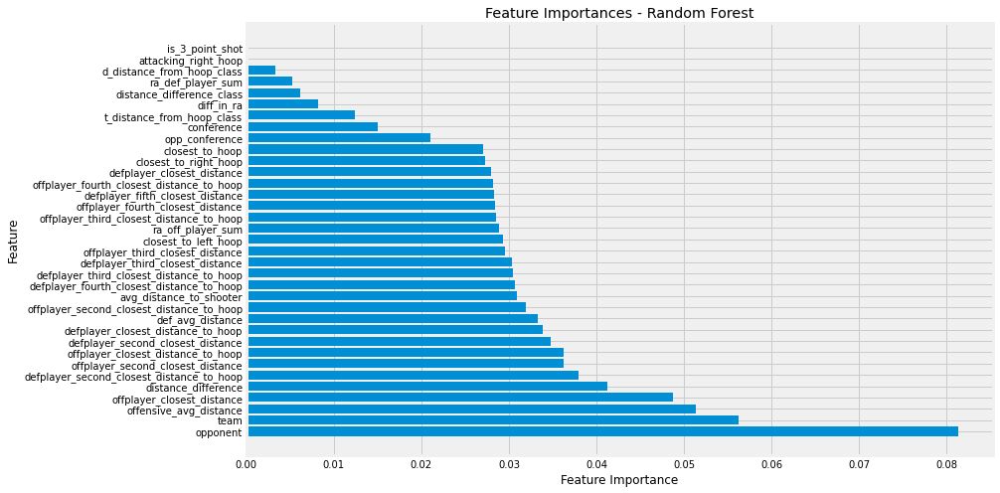

In [451]:
import matplotlib.pyplot as plt

# Fit the Random Forest model on the entire dataset
rf_model.fit(X, y)

# Get feature importances from the trained Random Forest model
feature_importances = rf_model.feature_importances_

# Get the names of the features
feature_names = X.columns

# Create a DataFrame with feature names and their corresponding importances
feature_importance_df = pd.DataFrame({
    "Feature": feature_names,
    "Importance": feature_importances
})

# Sort the features by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by="Importance", ascending=False)

# Plot the feature importances using a bar graph
plt.figure(figsize=(12, 8))
plt.barh(feature_importance_df["Feature"], feature_importance_df["Importance"])
plt.xlabel("Feature Importance")
plt.ylabel("Feature")
plt.title("Feature Importances - Random Forest")
plt.show()


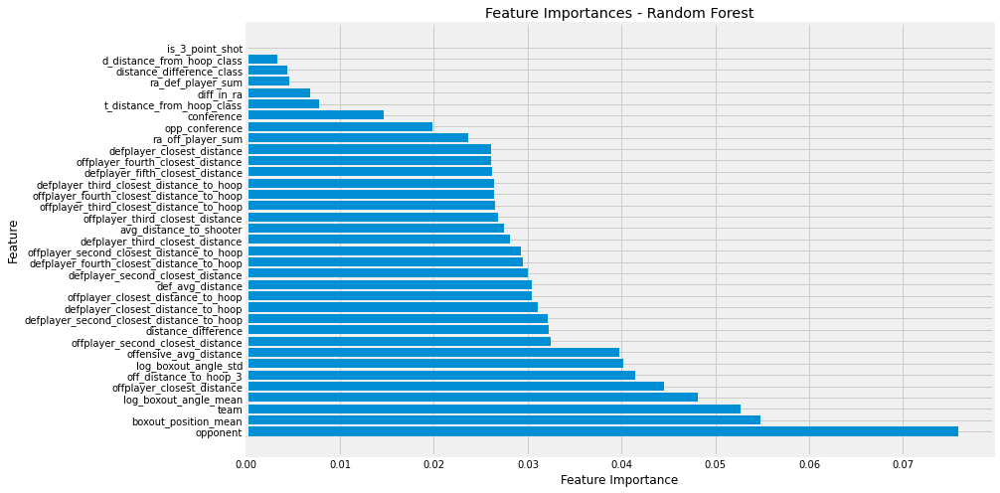

In [69]:
import matplotlib.pyplot as plt

# Fit the Random Forest model on the entire dataset
rf_model.fit(X, y)

# Get feature importances from the trained Random Forest model
feature_importances = rf_model.feature_importances_

# Get the names of the features
feature_names = X.columns

# Create a DataFrame with feature names and their corresponding importances
feature_importance_df = pd.DataFrame({
    "Feature": feature_names,
    "Importance": feature_importances
})

# Sort the features by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by="Importance", ascending=False)

# Plot the feature importances using a bar graph
plt.figure(figsize=(12, 8))
plt.barh(feature_importance_df["Feature"], feature_importance_df["Importance"])
plt.xlabel("Feature Importance")
plt.ylabel("Feature")
plt.title("Feature Importances - Random Forest")
plt.show()

## GBoost

In [29]:
from sklearn.model_selection import KFold
from sklearn.metrics import log_loss
from sklearn.ensemble import GradientBoostingClassifier
import numpy as np
import pandas as pd

# Load your dataset and split it into features (X) and target (y)
# Assuming you have loaded your dataset into a DataFrame called 'train_df'

score_list = []
unseen_preds = []

# Create a list to store the log loss scores for each fold
score_list = []
# Initialize KFold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

for fold, (train_index, test_index) in enumerate(kf.split(X, y), start=1):
    X_train, X_val = X.iloc[train_index], X.iloc[test_index]
    y_train, y_val = y.iloc[train_index], y.iloc[test_index]

    # Initialize the Gradient Boosting Classifier
    gb_model = GradientBoostingClassifier(
        n_estimators=300,  # Number of boosting stages
        max_depth=5,        # Maximum depth of the individual trees
        learning_rate=0.1,  # Learning rate
        random_state=42
    )
    
    # Fit the Gradient Boosting model
    gb_model.fit(X_train, y_train)
    
    # Predict probabilities for the test set
    sub_pred = gb_model.predict_proba(to_sub)[:, 1]
    
    # Calculate log loss score for validation set
    score = log_loss(y_val, gb_model.predict_proba(X_val)[:, 1])
    score_list.append(score)
    
    # Predict probabilities for test data (unseen data)
    sub_pred = gb_model.predict_proba(to_sub)[:, 1]
    unseen_preds.append(sub_pred)
    print(f"Fold-{fold} Log Loss: {score:.4f}")

print("CV Mean Log Loss:", np.mean(score_list))
# Calculate the mean of unseen predictions across all folds
mean_unseen_preds = np.mean(unseen_preds, axis=0)

# Create a DataFrame with submission format
submission = pd.DataFrame({"id": test_df.id, "pred": mean_unseen_preds})

# Save the submission DataFrame to a CSV file
submission.to_csv("submission_gb20.csv", index=False)


Fold-1 Log Loss: 0.5797
Fold-2 Log Loss: 0.5741
Fold-3 Log Loss: 0.5877
Fold-4 Log Loss: 0.5835
Fold-5 Log Loss: 0.5841
CV Mean Log Loss: 0.5818155579916471


In [180]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import KFold
from sklearn.metrics import log_loss
import numpy as np

# Initialize lists to store results
score_list = []
unseen_preds = []

# Define the number of splits for KFold
n_splits = 5
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

# Loop through the folds
for fold, (train_index, test_index) in enumerate(kf.split(X, y), start=1):
    X_train, X_val = X.iloc[train_index], X.iloc[test_index]
    y_train, y_val = y.iloc[train_index], y.iloc[test_index]

    # Instantiate the Random Forest model
    rf_model = RandomForestClassifier(n_estimators=200, random_state=0)

    # Train the model
    rf_model.fit(X_train, y_train)

    # Predict probabilities for validation data
    val_pred = rf_model.predict_proba(X_val)[:, 1]
    val_results.append(val_pred)

    # Calculate log loss for validation data
    score = log_loss(y_val, val_pred)
    print(f"LOGLOSS FOLD-{fold}: {score}")

    # Store validation log loss in the list
    score_list.append(score)

    # Predict probabilities for test data (unseen data)
    sub_pred = rf_model.predict_proba(to_sub)[:, 1]
    unseen_preds.append(sub_pred)

print("CV Mean Score:", np.mean(score_list))

# Calculate the mean of unseen predictions across all folds
mean_unseen_preds = np.mean(unseen_preds, axis=0)

# Create a DataFrame with submission format
submission = pd.DataFrame({"id": to_sub.index, "pred": mean_unseen_preds})

# Save the submission DataFrame to a CSV file
submission.to_csv("submission_rf.csv", index=False)


LOGLOSS FOLD-1: 0.5828792860007235
LOGLOSS FOLD-2: 0.5734422842044847
LOGLOSS FOLD-3: 0.5913378711588504
LOGLOSS FOLD-4: 0.5805662500979791
LOGLOSS FOLD-5: 0.5856744961693857
CV Mean Score: 0.5827800375262846


In [ ]:
test_df["pred"] = np.mean(unseen_preds, axis = 0)
submission = test_df[["id", "pred"]]

In [134]:
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import log_loss
import catboost as cat
import gc
from catboost import CatBoostClassifier 
gc.collect()

score_list = []
fold = 1
unseen_preds = []
importance = []
val_results = []
X = train_df.drop(["id", "is_oreb", "dataset"], axis=1)
y = train_df.is_oreb
to_sub = test_df.drop(["id", "is_oreb", "dataset"], 1)
l1_reg_strength = 0.1  # Adjust this value for desired L1 regularization strength

kf = KFold(n_splits=5, shuffle=True, random_state=42)
for train_index, test_index in kf.split(X, y):
    X_train, X_val = X.iloc[train_index], X.iloc[test_index]
    y_train, y_val = y.iloc[train_index], y.iloc[test_index]
    
    cat_model = CatBoostClassifier(
        iterations=2000,
        loss_function='Logloss',
        eval_metric='Logloss',
        bootstrap_type="Bayesian",
        bagging_temperature=4,
        allow_writing_files=False,
        random_seed=0,
        l2_leaf_reg=l1_reg_strength  # Applying L1 regularization here
    )
    
    cat_model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=100, verbose=0)
    
    sub_pred = cat_model.predict_proba(to_sub)[:, 1]
    unseen_preds.append(sub_pred)
    val_results.append(cat_model.predict_proba(X_val)[:, 1])
    
    score = log_loss(y_val, cat_model.predict_proba(X_val)[:, 1])
    score_t = log_loss(y_train, cat_model.predict_proba(X_train)[:, 1])
    print(f"LOGLOSS FOLD-{fold}: {score}")
    print(f"LOGLOSS Train FOLD-{fold}: {score_t}")
    print(f'Train Mean: {y_train.mean()}')
    print(f'Val Mean: {y_val.mean()}')
    print(f'Val Predicted Mean: {cat_model.predict(X_val).mean()}')
    print(f'Predicted Mean: {np.mean(sub_pred)}')
    print("********")
    score_list.append(score)
    importance.append(cat_model.get_feature_importance())
    fold += 1

print("CV Mean Score:", np.mean(score_list))


LOGLOSS FOLD-1: 0.5711088567646683
LOGLOSS Train FOLD-1: 0.5556807589214694
Train Mean: 0.28177243953903586
Val Mean: 0.2825839961045285
Val Predicted Mean: 0.01655575393604934
Predicted Mean: 0.28077475220112047
********
LOGLOSS FOLD-2: 0.5633283810203189
LOGLOSS Train FOLD-2: 0.5488263561464942
Train Mean: 0.28424768706378833
Val Mean: 0.2726830060055186
Val Predicted Mean: 0.0297029702970297
Predicted Mean: 0.28353481289399995
********
LOGLOSS FOLD-3: 0.5802879278486638
LOGLOSS Train FOLD-3: 0.5544508024888963
Train Mean: 0.28006817075150137
Val Mean: 0.28940107125466646
Val Predicted Mean: 0.018828112319428665
Predicted Mean: 0.27911004626423025
********
LOGLOSS FOLD-4: 0.5701727076952017
LOGLOSS Train FOLD-4: 0.5545081595831256
Train Mean: 0.28225937347833147
Val Mean: 0.28063626034734623
Val Predicted Mean: 0.022885895146891738
Predicted Mean: 0.2812852862132224
********
LOGLOSS FOLD-5: 0.5744905498879149
LOGLOSS Train FOLD-5: 0.5477231302435552
Train Mean: 0.2813260834280149
Val

## NN and Ensemble model Experimentation 

In [149]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import log_loss

# Load your dataset
# Assuming you have loaded your dataset into a DataFrame called 'df'

X = train_df.drop(["id", "is_oreb","dataset","shooter_x","defplayer_fourth_closest_distance"], 1)
y = train_df.is_oreb  # Adjust 'target_column' to your actual target column name

# Split the dataset into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32).view(-1, 1)  # Reshape y_train to match the model's output
X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)

# Define a simple neural network model
class NeuralNet(nn.Module):
    def __init__(self, input_size):
        super(NeuralNet, self).__init__()
        self.fc1 = nn.Linear(input_size, 64)
        self.fc2 = nn.Linear(64, 32)
        self.fc3 = nn.Linear(32, 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.sigmoid(self.fc3(x))
        return x

# Instantiate the model
input_size = X_train_tensor.shape[1]
model = NeuralNet(input_size)

# Define loss function and optimizer
criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop
num_epochs = 100
for epoch in range(num_epochs):
    model.train()
    
    optimizer.zero_grad()
    outputs = model(X_train_tensor)
    loss = criterion(outputs, y_train_tensor)
    loss.backward()
    optimizer.step()
    
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32).view(-1, 1) 
# Evaluate on the test set
model.eval()
with torch.no_grad():
    test_outputs = model(X_test_tensor)
    test_loss = criterion(test_outputs, y_test_tensor)
    print(f'Test Loss: {test_loss.item():.4f}')



Epoch [1/100], Loss: 0.6608
Epoch [2/100], Loss: 0.6566
Epoch [3/100], Loss: 0.6526
Epoch [4/100], Loss: 0.6487
Epoch [5/100], Loss: 0.6449
Epoch [6/100], Loss: 0.6412
Epoch [7/100], Loss: 0.6376
Epoch [8/100], Loss: 0.6341
Epoch [9/100], Loss: 0.6306
Epoch [10/100], Loss: 0.6273
Epoch [11/100], Loss: 0.6241
Epoch [12/100], Loss: 0.6210
Epoch [13/100], Loss: 0.6180
Epoch [14/100], Loss: 0.6152
Epoch [15/100], Loss: 0.6125
Epoch [16/100], Loss: 0.6100
Epoch [17/100], Loss: 0.6076
Epoch [18/100], Loss: 0.6054
Epoch [19/100], Loss: 0.6033
Epoch [20/100], Loss: 0.6014
Epoch [21/100], Loss: 0.5997
Epoch [22/100], Loss: 0.5981
Epoch [23/100], Loss: 0.5966
Epoch [24/100], Loss: 0.5953
Epoch [25/100], Loss: 0.5941
Epoch [26/100], Loss: 0.5929
Epoch [27/100], Loss: 0.5919
Epoch [28/100], Loss: 0.5909
Epoch [29/100], Loss: 0.5900
Epoch [30/100], Loss: 0.5892
Epoch [31/100], Loss: 0.5883
Epoch [32/100], Loss: 0.5876
Epoch [33/100], Loss: 0.5869
Epoch [34/100], Loss: 0.5862
Epoch [35/100], Loss: 0

In [166]:
submission

,id,pred
0,2790-2,0.282827
1,4712-4,0.167423
2,2094-2,0.187270
3,4956-9,0.287383
4,2135-5,0.345482
...,...,...
13197,4525-7,0.216659
13198,5006-9,0.303759
13199,4737-6,0.314535
13200,390-3,0.246644


In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import KFold
from sklearn.metrics import log_loss
from sklearn.preprocessing import StandardScaler

# Load your dataset
# Assuming you have loaded your dataset into a DataFrame called 'train_df'
X = train_df.drop(["id", "is_oreb", "dataset", "shooter_x", "defplayer_fourth_closest_distance"], axis=1)
y = train_df.is_oreb

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Convert to PyTorch tensors
X_tensor = torch.tensor(X_scaled, dtype=torch.float32)
y_tensor = torch.tensor(y.values, dtype=torch.float32).view(-1, 1)

# Define a simple neural network model
class NeuralNet(nn.Module):
    def __init__(self, input_size):
        super(NeuralNet, self).__init__()
        self.fc1 = nn.Linear(input_size, 64)
        self.fc2 = nn.Linear(64, 32)
        self.fc3 = nn.Linear(32, 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.sigmoid(self.fc3(x))
        return x

# Instantiate the model
input_size = X_tensor.shape[1]
model = NeuralNet(input_size)

# Define loss function and optimizer
criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# K-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
score_list = []
unseen_preds = []

for fold, (train_index, test_index) in enumerate(kf.split(X_tensor)):
    X_train, X_val = X_tensor[train_index], X_tensor[test_index]
    y_train, y_val = y_tensor[train_index], y_tensor[test_index]
    
    model.train()
    optimizer.zero_grad()
    
    outputs = model(X_train)
    loss = criterion(outputs, y_train)
    loss.backward()
    optimizer.step()
    
    model.eval()
    with torch.no_grad():
        val_outputs = model(X_val)
        score = log_loss(y_val.numpy(), val_outputs.numpy())
        score_list.append(score)
        
        test_outputs = model(X_test_tensor)
        unseen_preds.append(test_outputs.numpy())
        
        print(f"FOLD-{fold + 1} - Log Loss: {score:.4f}")
    
print("CV Mean Log Loss:", np.mean(score_list))

# Calculate mean of predictions across all folds for submission
submission_preds = np.mean(unseen_preds, axis=0)
test_df["pred"] = submission_preds
submission = test_df[["id", "pred"]]


In [ ]:
test_df["pred"] = test_outputs.numpy()
submission = test_df[["id", "pred"]]

In [135]:
test_df["pred"] = np.mean(unseen_preds, axis = 0)
submission = test_df[["id", "pred"]]

In [136]:
submission.to_csv("submission_public6.csv", index = False)

In [37]:
print(combined_datasets.drop(columns = ['id',"dataset"]).corr()["is_oreb"].sort_values(ascending=False)  )

is_oreb                  1.000000
off_within_10ft_sum      0.138364
ra_off_player_sum        0.136338
opponent                 0.135585
team                     0.111192
                           ...   
log_boxout_angle_mean   -0.124437
boxout_position_2       -0.135406
boxout_angle_mean       -0.135796
boxout_position_mean    -0.139962
is_3_point_shot               NaN
Name: is_oreb, Length: 130, dtype: float64


In [41]:
import pandas as pd

# Assuming you already have the combined_datasets DataFrame

# Calculate correlations
correlations = combined_datasets.drop(columns=['id', "dataset"]).corr()["is_oreb"].sort_values(ascending=False)

# Create a DataFrame to display the correlations
correlation_df = pd.DataFrame({'Feature': correlations.index, 'Correlation': correlations.values})

# Set display options to show the entire DataFrame
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
pd.set_option("display.width", None)

# Display the DataFrame
print(correlation_df)

# Reset display options to default if needed
pd.reset_option("display.max_rows")
pd.reset_option("display.max_columns")
pd.reset_option("display.width")


                                       Feature  Correlation
0                                      is_oreb     1.000000
1                          off_within_10ft_sum     0.138364
2                            ra_off_player_sum     0.136338
3                                     opponent     0.135585
4                                         team     0.111192
5                             boxout_angle_std     0.107174
6                          boxout_position_std     0.099785
7                   betweenness_centrality_std     0.099173
8                 off_within_10ft_weakside_sum     0.097858
9                   betweenness_centrality_max     0.097293
10                        log_boxout_angle_std     0.097216
11                    off_distance_to_hoop_std     0.094765
12                 betweenness_centrality_mean     0.087784
13                         def_within_10ft_sum     0.076417
14                              opp_conference     0.068270
15                           ra_def_play

In [45]:
def cross_val_model_score(model, X_, y_):
    #perform cross-validation
    cross_val_scores = cross_val_score(model, X_, y_, cv=5, scoring='neg_log_loss')

    # since cross_val_score returns negative log loss values, we take the negative to get the positive log loss
    log_loss_scores = -cross_val_scores
    return log_loss_scores.mean()

In [46]:
def evaluate_models(models_dict, X, y):
    """
    Evaluates a dictionary of models using cross-validation.

    Parameters:
    - models_dict: Dictionary with model name as key and model object as value
    - X: Feature matrix
    - y: Target variable

    Returns:
    - DataFrame with models as rows and their corresponding log loss scores
    """
    results = {}
    for name, model in models_dict.items():
        results[name] = cross_val_model_score(model, X, y)

    # convert dictionary to DataFrame
    results_df = pd.DataFrame.from_dict(results, orient='index', columns=['Log Loss'])

    return results_df

In [48]:
import pandas as pd
import xgboost as xgb
from xgboost import XGBClassifier # Import the xgboost module
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, cross_val_score, StratifiedKFold, KFold
from sklearn.metrics import make_scorer, log_loss, accuracy_score, confusion_matrix, classification_report
from sklearn.svm import SVC
models = {
    'XGBoost': xgb.XGBClassifier(learning_rate=0.1, n_estimators=100, objective='binary:logistic', 
                          eval_metric='logloss', max_depth=2, min_child_weight=5),
    'Random Forest': RandomForestClassifier(max_depth=5),
    'Logistic Regression': LogisticRegression()
}
df_results = evaluate_models(models, X, y)
print(df_results)

                     Log Loss
XGBoost              0.650516
Random Forest        0.576301
Logistic Regression  0.582069


In [330]:
print(traintest.drop(columns = ['id',"dataset","shooter_x","defplayer_fourth_closest_distance"]).corr()["is_oreb"] ) 

is_oreb                              1.000000
team                                 0.111192
opponent                             0.135585
conference                           0.058593
opp_conference                       0.068270
in_right_defensive_total             0.004060
in_left_defensive_total             -0.004060
in_right_offensive_total             0.003933
in_left_offensive_total             -0.003933
difference_in_numbers                0.002047
ball_side                            0.003467
def_avg_distance                    -0.046557
offensive_avg_distance              -0.098034
d_distance_from_hoop_class          -0.068322
t_distance_from_hoop_class          -0.109505
distance_difference                  0.058025
distance_difference_class            0.051631
shooter_y                            0.004643
defplayer_closest_distance          -0.030948
defplayer_second_closest_distance   -0.060049
defplayer_third_closest_distance    -0.054708
defplayer_fifth_closest_distance  

In [333]:
traintest = train_df